# Coursework 1: Learning Learning, From Scratch

**Questions:**

[Question 1](#question1): Linear Fitting (10 points)

[Question 2](#question2): PCA (12 points)

[Question 3](#question3): Linear Classification (18 points)

[Question 4](#question4): Image Denoising (30 points)

[Question 5](#question5): Neural Implicit Representation (30 points)

In [1]:
# Importing packages
import numpy as np
import random
import os

import matplotlib.pyplot as plt

from scipy import optimize
from sklearn import datasets as skdataset
from sklearn.model_selection import train_test_split
from pathlib import Path

import os
from PIL import Image

import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader
import torch.nn.functional as F
from torch.utils.data import Dataset

import imageio
from PIL import Image
import cv2

from tqdm import tqdm
from skimage.metrics import peak_signal_noise_ratio
from IPython.display import Video

%matplotlib inline

## Data Loading

The following cells are used to load IRIS and MNIST datasets.

In [13]:
def load_iris_dataset(num_classes=2):
    # Load the datadet from SkDataset
    iris = skdataset.load_iris()
    X = iris.data
    Y = iris.target
    # Reduce the number of classes
    idx = Y < num_classes
    X = X[idx]
    Y = Y[idx]
    return X, Y

In [14]:
def load_mnist_dataset(num_classes=2):
    # Load the datadet from SkDataset
    X, Y = skdataset.fetch_openml('mnist_784', version=1, return_X_y=True,as_frame=False)
    Y = Y.astype(np.int64)
    # Reduce the number of classes
    idx = Y < num_classes
    X = X[idx]
    Y = Y[idx]
    return X, Y

def load_mnist_dataset_onevsall(class_id=7):
    # Load the datadet from SkDataset
    X, Y = skdataset.fetch_openml('mnist_784', version=1, return_X_y=True,as_frame=False)
    Y = Y.astype(np.int64)
    # One versus all
    idx = Y == class_id
    Y[~idx] = 0
    Y[idx]  = 1
    return X, Y

## Functions for visualization

In [15]:
def plot_correlation(X1, X2):
    # Plot both variables
    plt.figure(figsize=(8, 6))
    plt.clf()
    plt.scatter(X1, X2, edgecolor='k')
    line = np.linspace(min(X1.min(), X2.min()), max(X1.max(), X2.max()), 20)
    plt.plot(line, line, 'r')
    plt.xlabel('Variable 1')
    plt.ylabel('Variable 2')
    plt.show()

In [16]:
def plot_eigenvecs(stacked_images, n_rows, n_columns, img_shape=None, channels=1):
    n_images, n_dims = stacked_images.shape
    plt.figure()
    for i in range(n_rows * n_columns):
        plt.subplot(n_rows, n_columns, i + 1)
        if channels == 1:
            # Normalize eigen vector to [0, 255] range
            eigenvector = stacked_images[i] - np.min(stacked_images[i])
            eigenvector /= np.max(eigenvector) + 1e-8
            eigenvector = (eigenvector * 255).astype(np.uint8)
            plt.imshow(np.reshape(eigenvector, [int(np.sqrt(n_dims)), int(np.sqrt(n_dims))]), cmap='gray')
        elif channels == 3:
            # Normalize eigen vector to [0, 255] range for each channel
            eigenvector = stacked_images[i].reshape(img_shape[0], img_shape[1], 3)
            eigenvector -= np.min(eigenvector)
            eigenvector /= np.max(eigenvector) + 1e-8
            eigenvector = (eigenvector * 255).astype(np.uint8)
            plt.imshow(eigenvector)
        plt.axis('off')
    plt.show()

def plot_images(stacked_images, n_rows, n_columns, titles, num_channels=1):
    n_images, n_dims = stacked_images.shape
    plt.figure()
    for i in range(n_rows * n_columns):
        plt.subplot(n_rows, n_columns, i + 1)

        if num_channels == 1:
            # Grayscale image
            plt.imshow(np.reshape(stacked_images[i], [int(np.sqrt(n_dims)), int(np.sqrt(n_dims))]), cmap='gray', vmin=0, vmax=1)
        elif num_channels == 3:
            # RGB image
            image = np.reshape(stacked_images[i], [int(np.sqrt(n_dims // 3)), int(np.sqrt(n_dims // 3)), 3])
            image = np.clip(image, 0, 1)  # Ensure pixel values are within [0, 1] range
            plt.imshow(image)
        else:
            raise ValueError("Unsupported number of channels. Use num_channels=1 for grayscale or num_channels=3 for RGB.")

        plt.axis('off')

        if len(titles) == n_rows * n_columns:
            plt.title(titles[i])

    plt.show()

def plot_images_with_text(images, titles, texts=None):
    N_cols = len(images)
    N_rows = len(images[0])

    fig, axs = plt.subplots(N_rows, N_cols, figsize=(20, 15))

    if titles is not None:
        for i, ax in enumerate(axs[0]):
            ax.set_title(titles[i])

    for i, img_col in enumerate(images):
        for j, img in enumerate(img_col):
            if len(img.shape) == 2:
                axs[j,i].imshow(img, interpolation='nearest', cmap='gray')
            else:
                axs[j,i].imshow(img, interpolation='nearest')
            axs[j,i].axis('off')
            if texts is not None:
                axs[j,i].text(0.5,-0.1, str(texts[j][i])[:4], size=10, ha="center", transform=axs[j,i].transAxes)
    plt.show()



In [17]:
def plot_images_horizontal(imgs):
    num_imgs = len(imgs)
    f = plt.figure(figsize=(40, 15))
    for i in range(num_imgs):
        f.add_subplot(1, num_imgs, i+1)
        plt.imshow(imgs[i])
    plt.show()

In [18]:
def true_positive(Y_test, y_pred):
    mask = (Y_test == 1)
    tp = (Y_test[mask] == y_pred[mask]).sum()
    return tp.item()

def true_negative(Y_test, y_pred):
    mask = (Y_test == 0) | (Y_test == -1)
    tn = (Y_test[mask] == y_pred[mask]).sum()
    return tn.item()

def false_negative(Y_test, y_pred):
    mask = (y_pred == 0) | (y_pred == -1)
    tn = (Y_test[mask] != y_pred[mask]).sum()
    return tn.item()

def false_positive(Y_test, y_pred):
    mask = (y_pred == 1)
    tn = (Y_test[mask] != y_pred[mask]).sum()
    return tn.item()

def plot_confusion_matrix(Y_test, y_pred):
    tp = true_positive(Y_test, y_pred)
    tn = true_negative(Y_test, y_pred)
    fp = false_positive(Y_test, y_pred)
    fn = false_negative(Y_test, y_pred)
    cf = np.array([[tn, fp], [fn, tp]])
    fig, ax = plt.subplots()
    ax.matshow(cf, cmap=plt.cm.Blues)
    for i in range(2):
        for j in range(2):
            c = cf[i,j]
            ax.text(j, i, str(c), va='center', ha='center')
    plt.xlabel('Prediction')
    plt.ylabel('Target')
    plt.show()

## Data Loading

_IRIS_ dataset

In [19]:
X, Y = load_iris_dataset(num_classes=3)
X_iris, X_iris_test, Y_iris, Y_iris_test = train_test_split(X, Y, test_size=0.1, random_state=RAND_ST) # 90% training and 10% test

_MNIST_ **dataset**

In [20]:
X, Y = load_mnist_dataset(num_classes=10)
X = X / 255.0
X_mnist, X_mnist_test, Y_mnist, Y_mnist_test = train_test_split(X, Y, test_size=0.1, random_state=RAND_ST) # 90% training and 10% test

/Users/huba/anaconda3/envs/ml/lib/python3.10/site-packages/sklearn/datasets/_openml.py:1022: FutureWarning: The default value of `parser` will change from `'liac-arff'` to `'auto'` in 1.4. You can set `parser='auto'` to silence this warning. Therefore, an `ImportError` will be raised from 1.4 if the dataset is dense and pandas is not installed. Note that the pandas parser may return different data types. See the Notes Section in fetch_openml's API doc for details.
  warn(


## 1. Linear Fitting (10 points)
<a name='question1'></a>

[a)](#question1a) Implement the normal equation solver function **nsolve**, which takes as input the matrix **X** and the target vector **y** and returns the optimized weights **w**. Test your code with your own mockup/randomly created data. (**5 points**)

[b)](#question1b) Implement **line_fit(X,y)** which should fit a linear function to the input data. Test your implementation on the following task: predict with linear fitting the _petal length (cm)_ of the Iris dataset using the three remaining variables as inputs (_sepal length (cm)_, _sepal width (cm)_ and _petal width (cm)_). Report the L2 loss on the validation set and plot a graph showing the correlation between y and your prediction on the test set. (**2 points**)

[c)](#question1c) Implement **poly_fit(X,y)** which should fit a 2nd degree polynomial to the input data. Test your implementation on the following task: predict with the polynomial the petal width (cm) of the _IRIS_ dataset using the three remaining variables as inputs (sepal length (cm), sepal width (cm), petal length (cm)). The 2nd degree polynomial should consider all possible pairwise terms, i.e. $w_1x^2 + w_2xy+ w_3y^2 + w_4x+ w_5y+ w_6$ in the case of two input variables $x$ and $y$. Report the L2 loss on the validation set and plot a graph showing the correlation between $y$ and your prediction on the test set. (**3 points**)

**Question 1a**
<a name='question1a'></a>

Implement the nsolve function

In [15]:
def nsolve(X,y):
    """
    Write your implementation of nsolve here.

    Arguments:
    X : Data matrix
    y : Labels

    Returns:
    w : Weights
    """

    #begin_solution

    # Use pseudoinverse to ensure numerical stability on
    # non-invertible (or ill-conditioned) matrices
    X_pseudo_inv = np.linalg.pinv(X)
    w = X_pseudo_inv @ y

    # Traditional normal equation is less stable
    # w = np.linalg.inv(X.T @ X) @ X.T @ y

    #end_solution


    return w

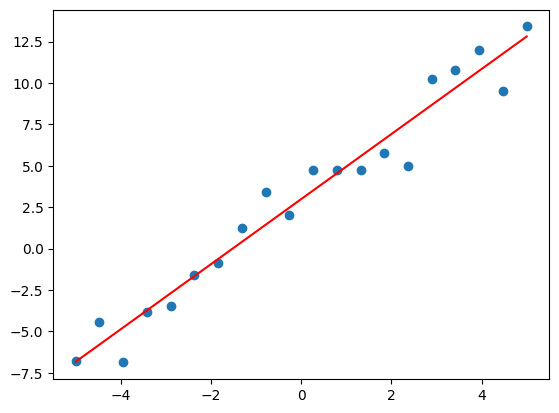

array([2.98671495, 1.96406414])

In [16]:
"""
After implementing nsolve, test it below on some mock data using np.random
"""

#begin_solution

x = np.linspace(-5,5,20)
y = 2 * x + 3 + np.random.normal(0,2,len(x))

X = np.column_stack([np.ones(len(x)),x.reshape(-1,1)])
w = nsolve(X, y)

plt.scatter(x, y)
plt.plot(x, X @ w, color='red')
plt.show()
w

#end_solution


**Question 1b**
<a name='question1b'></a>

Implement the line_fit function and test

In [17]:
def line_fit(X,y):
    """
    Write your implementation of line_fit here.

    Arguments:
    X : Data matrix
    y : Labels

    Returns:
    w : Weights
    l2_error : L2 Prediction error using learned w
    """

    #begin_solution

    # Add column of ones to account for bias term
    X = np.column_stack([np.ones(len(X)), X])
    w = nsolve(X, y)
    l2_error = np.linalg.norm(X @ w - y, ord=2) / len(y)

    #end_solution


    return w, l2_error

In [18]:
"""
After implementing line_fit, test it below on IRIS Train set.
Print the L2 error on the Training set.
"""

#begin_solution

# The description for 1.b above states "Report the L2 loss on the validation set".
# However, in this cell we are asked to print the L2 loss on the training set, so
# the below code reports the L2 loss on the training set.
X_train = X_iris[:,[0,1,3]]
y_train = X_iris[:,2]

w, l2_error_train = line_fit(X_train, y_train)
l2_error_train

#end_solution


0.026182097818010713

In [19]:
"""
After implementing line_fit, test it below on IRIS Test set.
Print the L2 error with respect to Test set.
"""


#begin_solution

X_test = X_iris_test[:,[0,1,3]]
X_test = np.column_stack([np.ones(len(X_test)), X_test])

y_test = X_iris_test[:,2]
y_pred = X_test @ w

l2_error_test = np.linalg.norm(y_pred - y_test, ord=2) / len(y_test)
l2_error_test

#end_solution


0.10407934523664689

Showing the correlation between X and y.

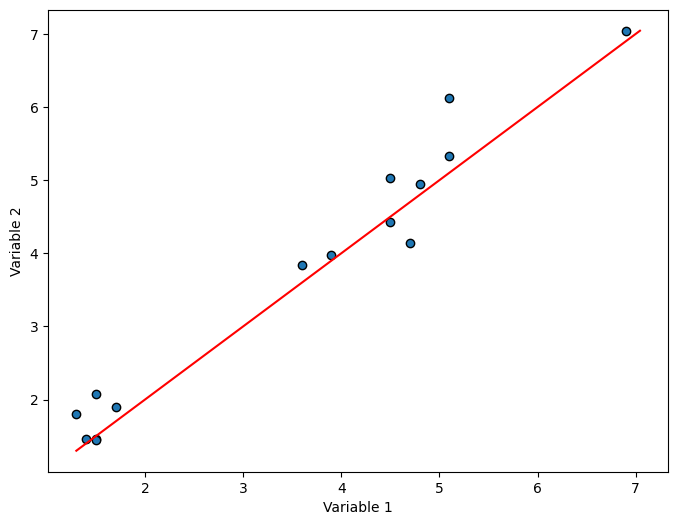

In [20]:
"""
Below, plot and display the correlation between true y and predicted values.
"""
#begin_solution

# Make sure to run all the cells in Question 1.a and 1.b directly before running this cell
plot_correlation(y_test, y_pred)

#end_solution


**Question 1c**
<a name='question1c'></a>

Implement the poly_fit function and test

In [22]:
def poly_fit(X,y):
    """
    Write your implementation of poly_fit here.

    Arguments:
    X : Data matrix
    y : Labels

    Returns:
    w : Weights
    l2_error : L2 prediction error using learned w
    """

    #begin_solution

    n_samples, n_features = X.shape
    X_poly = np.zeros((n_samples, n_features + (n_features * (n_features + 1)) // 2))

    # Set linear terms
    X_poly[:, :n_features] = X

    # Set pairwise terms, including x_i**2
    col_idx = n_features
    for i in range(n_features):
        for j in range(i, n_features):
            X_poly[:, col_idx] = X[:, i] * X[:, j]
            col_idx += 1

    X_poly = np.column_stack([np.ones(len(X_poly)), X_poly])
    w = nsolve(X_poly, y)
    l2_error = np.linalg.norm(X_poly @ w - y, ord=2) / len(y)

    #end_solution


    return w, l2_error

In [23]:
"""
After implementing poly_fit, test it below on IRIS Training set.
Print L2 error with respect to training set.
"""

#begin_solution

# The description for 1.c above states "Report the L2 loss on the validation set".
# However, in this cell we are asked to print the L2 loss on the training set, so
# the below code reports the L2 loss on the training set.
X_train = X_iris[:,[0,1,2]]
y_train = X_iris[:,3]

w, l2_error_train = poly_fit(X_train, y_train)
l2_error_train

#end_solution


0.015148419894155987

&#9998; <font color="#0047AB">
You need to modify the following cell with your own code.
</font>

In [24]:
"""
After implementing poly_fit, test it below on IRIS Test set.
Print L2 error with respect to test set.
"""

#begin_solution

X_test = X_iris_test[:,[0,1,2]]
y_test = X_iris_test[:,3]

n_samples, n_features = X_test.shape
X_poly = np.zeros((n_samples, n_features + (n_features * (n_features + 1)) // 2))

# Set linear terms
X_poly[:, :n_features] = X_test

# Set pairwise terms, including x_i**2
col_idx = n_features
for i in range(n_features):
    for j in range(i, n_features):
        X_poly[:, col_idx] = X_test[:, i] * X_test[:, j]
        col_idx += 1

X_poly = np.column_stack([np.ones(len(X_poly)), X_poly])

y_pred = X_poly @ w
l2_error_test = np.linalg.norm(y_pred- y_test, ord=2) / len(y_test)
l2_error_test

#end_solution


0.0574788887711124

Showing the correlation between X and y.

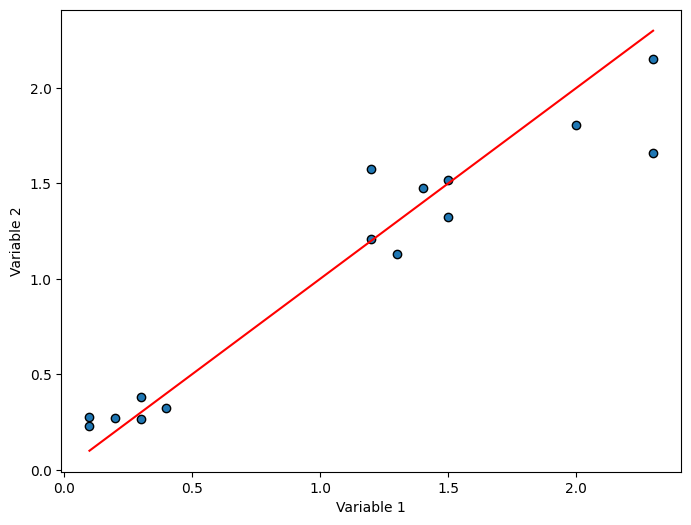

In [25]:
"""
Below, plot and display the correlation between true y and predicted values
"""

#begin_solution

# Make sure to run all the cells in Question 1.a and 1.c directly before running this cell
plot_correlation(y_test, y_pred)

#end_solution


## 2. PCA (12 points)
<a name='question2'></a>

[a)](#question2a) Implement a function pca(X, ndims) that performs PCA over the input data X and returns both the mean vector  ̄X and the ndims top components. The top components are the eigen vectors linked to the top eigen values computed from the covariance matrix. Try your function on the _MNIST_ dataset (which is composed of 10 digit classes) and on the _CELEBA_ dataset (which contains face RGB images). Display the top 10 components fitted on the train dataset as images.(**2 points** + **2 points** + **2 points**)

[b)](#question2b) Next, check that you can reconstruct perfectly an input image (digit or face) from the test set using all components, by implementing pca_projection(X, mean_vec, eig_vecs) and pca_reconstruction(weights, mean_vec, eig_vecs). (**2 points** + **2 points** + **2 points** on hidden dataset)

**Question 2a**
<a name='question2a'></a>

Implement PCA and plot Eigenvectors

In [27]:
def pca(X, ndims, num_image_channels=1):
    """
    Compute PCA on a batch of flattened grayscale or RGB images with dynamic dimensions.

    Arguments:
    X : Data matrix where each row is a flattened image
    ndims : Number of reduced dimensions

    Returns:
    mean_vec : Data mean
    top_eig_vecs : Selected eigen vectors, a matrix where each column corresponds
                    to an eigen vector
    """

    #begin_solution

    mean_vec = np.mean(X, axis=0)
    cov_mat = (X - mean_vec).T @ (X - mean_vec) / (len(X) - 1)
    eig_vals, eig_vecs = np.linalg.eigh(cov_mat)

    sorted_index = eig_vals.argsort()[::-1]
    eig_vals = eig_vals[sorted_index]
    eig_vecs = eig_vecs[:,sorted_index]
    top_eig_vecs = eig_vecs[:,:ndims]

    #end_solution


    return mean_vec, top_eig_vecs


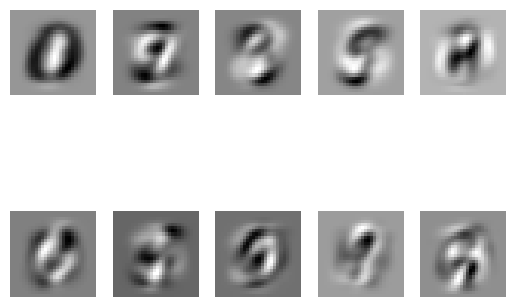

In [28]:
"""
Below, test your PCA on  MNIST dataset.
Plot and display the selected eigen vectors returned by PCA.

Use the plot_eigenvecs function provided above.
Read that function and pass arguments as needed.
"""

#begin_solution

# n must be even for plot_eigenvecs to plot all components
top_n_components = 10
mean_vec, top_eig_vecs = pca(X_mnist, top_n_components, num_image_channels=1)
plot_eigenvecs(top_eig_vecs.T, 2, top_n_components//2, img_shape=(28, 28), channels=1)

#end_solution


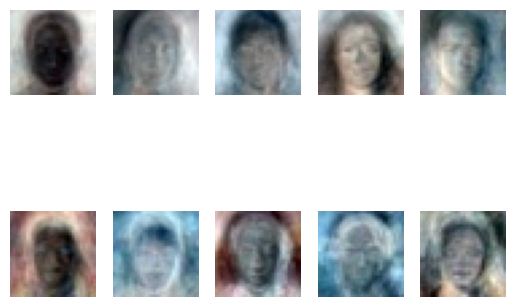

In [29]:
"""
Below, test your PCA on  CelebA dataset.
Plot and display the selected eigen vectors returned by PCA.

Use the plot_eigenvecs function provided above.
Read that function and pass arguments as needed.
"""

#begin_solution

top_n_components = 10
mean_vec, top_eig_vecs = pca(X_CelebA, top_n_components, num_image_channels=3)
plot_eigenvecs(top_eig_vecs.T, 2, top_n_components//2, img_shape=(32, 32), channels=3)

#end_solution


**Question 2b**

Now, we can evaluate if the code is working properly by projecting the first image of the test set on the eigen vectors.

In [31]:
def pca_projection(X, mean_vec, eig_vecs):
    """
    Write your implenetation of PCA projection here.

    Arguments:
    X : Data matrix
    mean_vec : Data mean
    eig_vecs : A numpy array where each column corresponds to an eigen vector

    Returns:
    weights : Weights corresponding to the eigen vectors
    """
    #begin_solution

    weights = (X - mean_vec) @ eig_vecs

    #end_solution


    return weights

In [32]:
def pca_reconstruction(weights, mean_vec, eig_vecs):
    """
    Write your implementation of PCA reconstruction here.

    Arguments:
    weights : Weights obtained from pca_projection
    mean_vec : Data mean
    eig_vecs : A numpy array where each column corresponds to an eigen vector
    """

    #begin_solution

    reconstruction = weights @ eig_vecs.T + mean_vec

    #end_solution


    return reconstruction

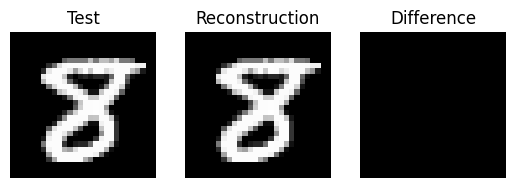

In [34]:
"""
Below,
1. Perform  PCA on MNIST training set, without reducing dimensions.
2. Project the first image of Test set to the eigen vectors using pca_projection.
3. Reconstruct that image using pca_reconstruction.
4. Display side-by-side, the Test image, its projection and the
   pixelwise difference between the two. Use the plotting functions provided.
"""

#begin_solution

# Perform PCA retaining all dimensions, then project and reconstruct
X_train = X_mnist
X_test = X_mnist_test[0]
dim = X_test.shape[0]
mean_vec, top_eig_vecs = pca(X_train, dim, num_image_channels=1)
weights = pca_projection(X_test, mean_vec, top_eig_vecs)
reconstruction = pca_reconstruction(weights, mean_vec, top_eig_vecs)

# Plot test, reconstruction and difference images with plot_images
test_image = np.reshape(X_test, (1, dim))
reconstruction = np.reshape(reconstruction, (1, dim))
diff = test_image - reconstruction
stacked_images = np.concatenate([test_image, reconstruction, diff])
plot_images(stacked_images, 1, len(stacked_images), titles=['Test', 'Reconstruction', 'Difference'], num_channels=1)

#end_solution


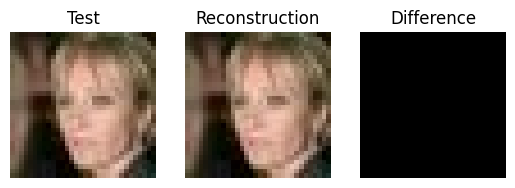

In [35]:
"""
Below,
1. Perform  PCA on CelebA training set, without reducing dimensions.
2. Project the first image of Test set to the eigen vectors using pca_projection.
3. Reconstruct that image using pca_reconstruction.
4. Display side-by-side, the Test image, its projection and the
   pixelwise difference between the two. Use the plotting functions provided.
"""

#begin_solution

# Perform PCA retaining all dimensions, then project and reconstruct
X_train = X_CelebA
X_test = X_CelebA_test[0]
dim = X_test.shape[0]
mean_vec, top_eig_vecs = pca(X_train, dim, num_image_channels=3)
weights = pca_projection(X_test, mean_vec, top_eig_vecs)
reconstruction = pca_reconstruction(weights, mean_vec, top_eig_vecs)

# Plot test, reconstruction and difference images with plot_images
test_image = np.reshape(X_test, (1, dim))
reconstruction = np.reshape(reconstruction, (1, dim))
diff = test_image - reconstruction
stacked_images = np.concatenate([test_image, reconstruction, diff])
plot_images(stacked_images, 1, len(stacked_images), titles=['Test', 'Reconstruction', 'Difference'], num_channels=3)

#end_solution


## 3. Linear Classification (18 points)
<a name='question3'></a>

[a)](#question3a) Implement the normal equation-based binary linear classifier lclass(examplesA, examplesB, testExamples) where the first two arguments are the set of samples from class A and class B respectively and the third is the test. The function should return a vector of 0s and 1s, 0 if test is in A and 1 otherwise. It should, for simplicity, both train and test in one function call. (**3 points**)
Test this on all the samples in _IRIS_, Setosa vs non-Setosa, and plot the confusion matrix. (**4 points** on hidden dataset)

[b)](#question3b) Extend the implementation in 3a to do multi-class classification. Implement lclass_prob(examplesA, examplesB, testExamples) and lmclass(examples, class, testExamples) that together perform multi-class classification of the examples examples according to the vector of labels class of the same size and test it with testExamples by returning a matrix, where each row expresses the probability of a sample in testExamples to belong to each class. Give the accuracy of your model. (**5 points** + **6 points** on hidden dataset)

Present findings applying multi-class classification on _IRIS_ dataset with 3 classes.

**Question 3a**
<a name='question3a'></a>

Implement Linear, binary classifier and test

In [36]:
def lclass(examplesA, examplesB, testExample):
    """
    Write your implementation of normal equation based linear classifier here.

    Arguments:
    examplesA : Matrix of samples from class A
    examplesB : Matrix of samples from class B
    testExample : Matrix of test samples to predict on

    Returns:
    preds : Predicted 0/1 labels on testExample
    """

    #begin_solution

    # exampleA is associated with label 0 and exampleB with label 1
    y = np.concatenate([np.zeros(len(examplesA)), np.ones(len(examplesB))])
    X_train = np.vstack([examplesA, examplesB])
    X_train = np.column_stack([np.ones(len(X_train)), X_train])
    testExample = np.column_stack([np.ones(len(testExample)), testExample])

    w = nsolve(X_train, y)
    preds = testExample @ w
    preds[preds < 0.5] = 0
    preds[preds >= 0.5] = 1
    preds = preds.astype(int)

    #end_solution


    return preds

_IRIS_

In [37]:
"""
After implementing lclass, test it below on the IRIS dataset.
"""

#begin_solution

X_train = X_iris
Y_train = Y_iris

setosa = X_train[Y_train == 0]
non_setosa = X_train[Y_train != 0]

# Description for Question 3.a says to "Test this (lclass) on all the samples in IRIS, Setosa vs non-Setosa"
# It's not clear whether this means to test on the training set or the test set, or perhaps both. To stay
# consistent with previous questions, and because of best practises testing is done on 'all of samples' in
# the IRIS TEST set. To see results on literally all samples in the IRIS dataset, uncomment the two
# np.concatenate lines below.
X_test = X_iris_test
# X_test = np.concatenate([X_iris_test, X_iris])
y_pred = lclass(setosa, non_setosa, X_test)

Y_test = Y_iris_test.copy()
# Y_test = np.concatenate([Y_iris_test, Y_iris])
Y_test[Y_test != 0] = 1
accuracy = (Y_test == y_pred).sum() / len(Y_test)

print(Y_test)
print(y_pred)
print(accuracy)

#end_solution


[1 0 1 1 1 0 1 1 1 1 1 0 0 0 0]
[1 0 1 1 1 0 1 1 1 1 1 0 0 0 0]
1.0


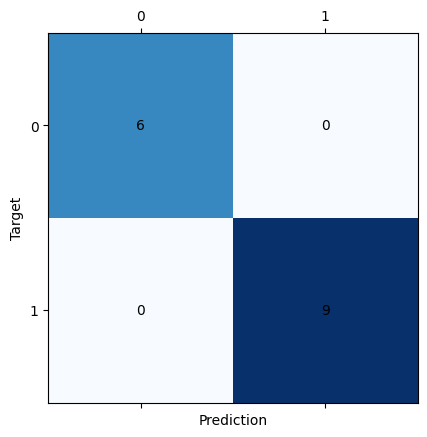

In [38]:
"""
Below, plot and display the confusion matrix of your prediction with respect to
true values. Use provided functions for plotting.
"""

#begin_solution

plot_confusion_matrix(Y_test, y_pred)

#end_solution


**Question 3b**
<a name='question3b'></a>

Implement Linear, multi-class classifier and test

In [40]:
def softmax(preds):
  """
  Write your implementation of the softmax activation here.

  Arguments:
  preds : The output predicted classes from your classifier

  Returns:
  activation : The outputs after applying softmax activation
  """

  #begin_solution

  activation = np.exp(preds) / np.sum(np.exp(preds))

  #end_solution


  return activation

In [41]:
def lclass_prob(examplesA, examplesB, testExample):
    """
    Write your implementation of lclass_prob here.

    Arguments:
    examplesA : Matrix of samples from class A
    examplesB : Matrix of samples from class B
    testExample : Matrix of test samples to predict on

    Returns:
    preds : Predicted probabilities of samples in testExample belonging to a class.
    """

    #begin_solution

    y = np.concatenate([np.zeros(len(examplesA)), np.ones(len(examplesB))])
    X_train = np.vstack([examplesA, examplesB])

    # Add column of ones to account for bias term
    X_train = np.column_stack([np.ones(len(X_train)), X_train])
    testExample = np.column_stack([np.ones(len(testExample)), testExample])

    w = nsolve(X_train, y)
    # Negate testExamples to get label B predictions, in other words probability of not belonging to label
    # A, in other words the probability of not belonging to the current label in the for loop in lmclass()
    label_B_preds = -testExample @ w
    preds = softmax(label_B_preds)

    #end_solution


    return preds

In [42]:
def lmclass(examples, labels, testExample):
    """
    Write your implementation of multiclass classifier lmclass here.
    Use your lclass_prob implementation here to solve this.

    Arguments:
    examples : The training data matrix
    labels : The training labels
    testExample : The testing data matrix

    Returns:
    preds_prob : For each sample in testExample, their predicted probabilities
                 of belonging to each class
    """

    #begin_solution

    unique_labels = np.unique(labels)
    preds_prob = np.zeros((len(testExample), len(unique_labels)))

    for i, label in enumerate(unique_labels):
        # Calculate the probability that data belongs to the current label or to any other
        # label (ie. simplify the multiclass classifier to a binary classification problem)
        examplesA = examples[labels == label]
        examplesB = examples[labels != label]
        preds = lclass_prob(examplesA, examplesB, testExample)
        preds_prob[:, i] = preds

    #end_solution


    return preds_prob

In [43]:
#begin_solution

X_train = X_iris
Y_train = Y_iris

X_test = X_iris_test
Y_test = Y_iris_test

preds = lmclass(X_train, Y_train, X_test)
y_pred = np.argmax(preds, axis=1)
accuracy = (y_pred == Y_test).sum() / len(Y_test)

print(Y_test)
print(y_pred)
print(accuracy)

#end_solution


[1 0 2 1 1 0 1 2 1 1 2 0 0 0 0]
[1 0 2 2 1 0 2 2 1 1 2 0 0 0 0]
0.8666666666666667


## 4. Denoising (30 points)
<a name='question4'></a>

[a)](#question4a) Implement `denoiseGauss(image)` to denoise the image `noisy_image.png` under `raw_datasets/Filtering/` using a
5×5 Gaussian filter. (**5 points**)

[b)](#question4b) Implement a convolutional neural network in Pytorch to denoise an image. We provide you pairs of noisy and
noise-free image patches of size 128×128 for training and testing, under `raw_datasets/Denoising/`. You may use all the infrastructure of `Pytorch`. The network should have sufficient depth and complexity to be able to converge well.  Please use ReLU non-linearities after each layer (**20 points**).

[c)](#question4c) Given the comparison between the Gaussian-kernel denoising and the neural network denoising
methods, discuss which method performs better and why. You should write no more than 5 sentences. (**5 points**)


**Question 4a**
<a name='question4a'></a>

In [23]:
def gkern(l=5, sig=1.):

    #begin_solution

    # Gaussian kernel calculation taken from
    # https://pages.stat.wisc.edu/~mchung/teaching/MIA/reading/diffusion.gaussian.kernel.pdf.pdf
    # and code taken from https://stackoverflow.com/a/29731818
    ax = np.arange(-l // 2 + 1., l // 2 + 1.)
    xx, yy = np.meshgrid(ax, ax)
    kernel = np.exp(-0.5 * (np.square(xx) + np.square(yy)) / np.square(sig))
    out_kernel = kernel / np.sum(kernel)

    #end_solution


    return out_kernel

def denoise_gauss(image):

    #begin_solution

    kernel = gkern()
    offset = kernel.shape[0] // 2

    # Convert to numpy array in case input is a pytorch tensor
    image = np.array(image)
    rows, cols, channels = image.shape
    denoised_image = np.zeros_like(image)

    for c in range(channels):
        for i in range(offset, rows - offset):
            for j in range(offset, cols - offset):
                row = slice(i - offset, i + offset + 1)
                col = slice(j - offset, j + offset + 1)
                neighborhood = image[row, col, c]
                weighted_sum = np.sum(neighborhood * kernel)
                denoised_image[i, j, c] = weighted_sum

    # Top, bottom, left and right padding in that order
    denoised_image[:offset, :, :] = np.flip(denoised_image[offset:offset*2, :, :], axis=0)
    denoised_image[-offset:, :, :] = np.flip(denoised_image[rows - offset*2:rows - offset, :, :], axis=0)
    denoised_image[:, :offset, :] = np.flip(denoised_image[:, offset:offset*2, :], axis=1)
    denoised_image[:, -offset:, :] = np.flip(denoised_image[:, cols - offset*2:cols - offset, :], axis=1)

    #end_solution


    return denoised_image

Load input image from file

In [24]:
if drive_mount:
  dataset_path = "/content/drive/MyDrive/raw_datasets/"
else:
  dataset_path = "./raw_datasets/"

noisy_image_filename = os.path.join(dataset_path,"Filtering/noisy_image.png")

Filter the input image

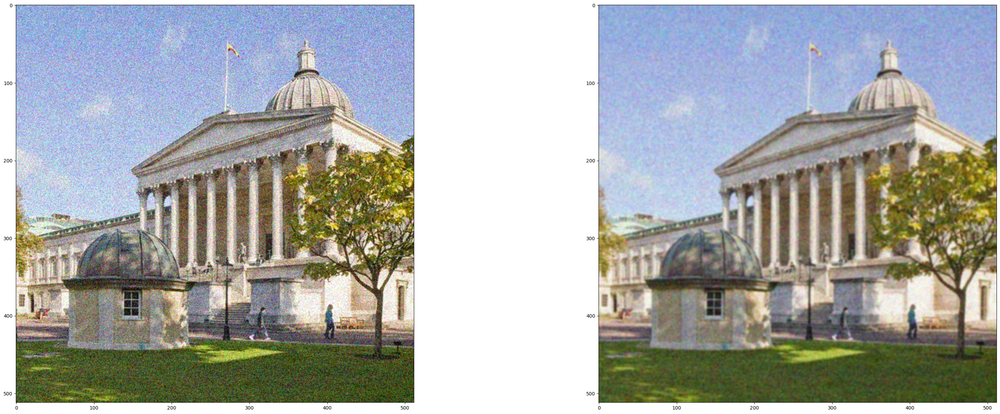

In [25]:
noisy_image = np.asarray(Image.open(noisy_image_filename).convert('RGB'))
denoised_image = denoise_gauss(noisy_image)
plot_images_horizontal([noisy_image, denoised_image])

**Question 4b**
<a name='question4b'></a>

Implement a neural denoiser using Pytorch

Implement dataset class below. Note that the images output by the `DenoisingDB` dataset should be of size 128 x 128. Crop the original images at the top left corner to get the aforementioned size.

In [26]:
class DenoisingDB(Dataset):

    def __init__(self, input_imgs_path, cleaned_imgs_path):
        super().__init__()

        #begin_solution

        self.image_size = 128
        self.max_pixel_value = 255.0

        self.input_image_paths = []
        for img in os.listdir(input_imgs_path):
            img_path = os.path.join(input_imgs_path, img)
            self.input_image_paths.append(img_path)

        self.cleaned_image_paths = []
        for img in os.listdir(cleaned_imgs_path):
            img_path = os.path.join(cleaned_imgs_path, img)
            self.cleaned_image_paths.append(img_path)

        if len(self.input_image_paths) != len(self.cleaned_image_paths):
            raise ValueError("Number of input images and cleaned images must be the same")

        #end_solution


    def __len__(self):
        #begin_solution

        length = len(self.input_image_paths)

        #end_solution

        return length

    def __getitem__(self, idx):

        #begin_solution

        input_img = Image.open(self.input_image_paths[idx]).convert('L')
        cleaned_img = Image.open(self.cleaned_image_paths[idx]).convert('L')

        input_img = input_img.crop((0, 0, self.image_size, self.image_size))
        cleaned_img = cleaned_img.crop((0, 0, self.image_size, self.image_size))

        input_img = np.array(input_img)
        cleaned_img = np.array(cleaned_img)

        input_img = torch.FloatTensor(input_img)
        cleaned_img = torch.FloatTensor(cleaned_img)

        input_img = input_img / self.max_pixel_value
        cleaned_img = cleaned_img / self.max_pixel_value

        input_img = input_img.unsqueeze(0)
        cleaned_img = cleaned_img.unsqueeze(0)

        #end_solution


        return (input_img, cleaned_img)

Implement the Denoising network:

Note that the network need to be sufficiently complex for performing the denoising task successfully. Feel free to experiment with different layers, blocks and operations.

In [27]:
class DenoisingCNN(nn.Module):
    def __init__(self):
        super(DenoisingCNN, self).__init__()

        #begin_solution

        padding = 1
        kernel_size = 3
        in_channels = 1
        out_channels = 1

        self.encoder = nn.Sequential(
            nn.Conv2d(in_channels, 32, kernel_size, padding=padding),
            nn.ReLU(),
            nn.Conv2d(32, 64, kernel_size, padding=padding),
            nn.ReLU(),
            nn.Conv2d(64, 128, kernel_size, padding=padding),
            nn.ReLU(),
            nn.BatchNorm2d(128),
        )

        self.decoder = nn.Sequential(
            nn.Conv2d(128, 64, kernel_size, padding=padding),
            nn.ReLU(),
            nn.Conv2d(64, 32, kernel_size, padding=padding),
            nn.ReLU(),
            nn.Conv2d(32, out_channels, kernel_size, padding=padding),
            nn.Sigmoid(),
        )
        # It has been confirmed by the TAs that it's allowed to use the Sigmoid activation function
        # in the final layer of the network, even though the question asks for a Relu activations.
        # Note: The model converges in both cases, the only difference is that the Sigmoid version
        # produces a fully white background, whereas the Relu predictions have light grey background.

        #end_solution


    def forward(self, x):

        #begin_solution

        encoded = self.encoder(x)
        x = self.decoder(encoded)

        #end_solution


        return x

# Create an instance of the network
model = DenoisingCNN()


Implement the reconstruction loss

In [28]:
def loss_function(prediction, target):
    """
    Calculate the Mean Squared Error (MSE) loss between the prediction and the target.

    Arguments:
    prediction : torch.Tensor
        The predicted image.
    target : torch.Tensor
        The target image for reconstruction.

    Returns:
    loss : torch.Tensor
        The computed loss.
    """

    #begin_solution

    loss = nn.MSELoss()(prediction, target)

    #end_solution


    return loss


Paths to input data

In [29]:
if drive_mount:
  dataset_path = "/content/drive/MyDrive/raw_datasets/"
else:
  dataset_path = "./raw_datasets/"

input_imgs_path = os.path.join(dataset_path,"Denoising/input_noisy_images/")
cleaned_imgs_path = os.path.join(dataset_path,"Denoising/target_clean_images/")

Splitting images into 128x128 patches...
Done
Epoch [1/20], Batch [100/1536], Loss: 0.0016415172722190619, Learning Rate: 0.001
Epoch [1/20], Batch [200/1536], Loss: 0.0015697430353611708, Learning Rate: 0.001
Epoch [1/20], Batch [300/1536], Loss: 0.0019107155967503786, Learning Rate: 0.001
Epoch [1/20], Batch [400/1536], Loss: 0.0007563093095086515, Learning Rate: 0.001
Epoch [1/20], Batch [500/1536], Loss: 0.002080892212688923, Learning Rate: 0.001
Epoch [1/20], Batch [600/1536], Loss: 0.0005688359378837049, Learning Rate: 0.001
Epoch [1/20], Batch [700/1536], Loss: 0.0006990153342485428, Learning Rate: 0.001
Epoch [1/20], Batch [800/1536], Loss: 0.0006577095482498407, Learning Rate: 0.001
Epoch [1/20], Batch [900/1536], Loss: 0.0002993306261487305, Learning Rate: 0.001
Epoch [1/20], Batch [1000/1536], Loss: 0.0005802814848721027, Learning Rate: 0.001
Epoch [1/20], Batch [1100/1536], Loss: 0.0006251126760616899, Learning Rate: 0.001
Epoch [1/20], Batch [1200/1536], Loss: 0.0006034426

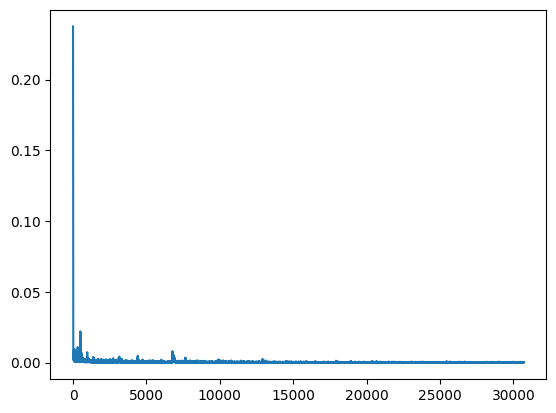

In [52]:
#begin_solution

# Images in the provided dataset are larger than 128x128 which presents the opportunity to
# create more training data by splitting the images into 128x128 patches. The below code
# iterates over all images in the dataset and creates the maximum number patches possible.
# Consequently, the code writes to the filesystem and should only be run once. Set the
# AUGMENT_DATA flag to False if you want to re-run the trainig loop multiple times.
AUGMENT_DATA = True
PATCH_SIZE = 128
AUGMENTED_INPUT_DATASET_PATH = "Denoising/augmented_dataset/input/"
AUGMENTED_CLEANED_DATASET_PATH = "Denoising/augmented_dataset/cleaned/"
os.makedirs(os.path.join(dataset_path, AUGMENTED_INPUT_DATASET_PATH), exist_ok=True)
os.makedirs(os.path.join(dataset_path, AUGMENTED_CLEANED_DATASET_PATH), exist_ok=True)

if AUGMENT_DATA:
    print(f"Splitting images into {PATCH_SIZE}x{PATCH_SIZE} patches...")
    for img in os.listdir(input_imgs_path):
        img_name = img[:-4]
        input_img = os.path.join(input_imgs_path, img)
        cleaned_img = os.path.join(cleaned_imgs_path, img)

        input_img = Image.open(input_img).convert('L')
        cleaned_img = Image.open(cleaned_img).convert('L')
        num_patches_x = input_img.size[0] // PATCH_SIZE
        num_patches_y = input_img.size[1] // PATCH_SIZE

        for i in range(num_patches_x):
            for j in range(num_patches_y):
                input_patch = input_img.crop((i * PATCH_SIZE, j * PATCH_SIZE, (i + 1) * PATCH_SIZE, (j + 1) * PATCH_SIZE))
                cleaned_patch = cleaned_img.crop((i * PATCH_SIZE, j * PATCH_SIZE, (i + 1) * PATCH_SIZE, (j + 1) * PATCH_SIZE))
                input_patch.save(os.path.join(dataset_path, AUGMENTED_INPUT_DATASET_PATH, f"{img_name}_{i}_{j}.png"))
                cleaned_patch.save(os.path.join(dataset_path, AUGMENTED_CLEANED_DATASET_PATH, f"{img_name}_{i}_{j}.png"))

    print("Done")

input_imgs_path = os.path.join(dataset_path, AUGMENTED_INPUT_DATASET_PATH)
cleaned_imgs_path = os.path.join(dataset_path, AUGMENTED_CLEANED_DATASET_PATH)



device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Best practise would be to split the dataset into training and test sets, however, in this question (4.b)
# we are not asked to report the performance on the test set. Therefore, the entire dataset is used for training
# (as specified by train_size = len(dataset)) to maximise the model's performance and minimise convergence time.
dataset = DenoisingDB(input_imgs_path, cleaned_imgs_path)
train_size = len(dataset) # int(0.8 * len(dataset))
test_size = len(dataset) - train_size
train_dataset, test_dataset = torch.utils.data.random_split(dataset, [train_size, test_size])
train_loader = DataLoader(train_dataset, batch_size=4, shuffle=True)

denoiser = DenoisingCNN().to(device)
optimizer = optim.Adam(denoiser.parameters(), lr=0.001)
scheduler = optim.lr_scheduler.StepLR(optimizer, step_size=5, gamma=0.75)
num_epochs = 20
current_loss = 1
losses = []

for epoch in range(num_epochs):
    denoiser.train()

    for batch_idx, (input_img, cleaned_img) in enumerate(train_loader):
        input_img = input_img.to(device)
        cleaned_img = cleaned_img.to(device)

        optimizer.zero_grad()
        pred = denoiser(input_img)

        loss = loss_function(pred, cleaned_img)
        loss.backward()
        optimizer.step()
        current_loss = loss.item()
        losses.append(current_loss)

        if (batch_idx + 1) % 100 == 0:
            print(f"Epoch [{epoch + 1}/{num_epochs}], Batch [{batch_idx + 1}/{len(train_loader)}], Loss: {loss.item()}, Learning Rate: {scheduler.get_last_lr()[0]}")

        if loss.item() < 0.0001:
            break

    scheduler.step()
    if current_loss < 0.0001:
        break

# Currently, the model converges to a loss of 0.0001 in around 30 seconds. This is true for both models
# (last layer Sigmoid, last layer Relu), however, as explained in the DenoisinCNN cell predictions are
# more accurate when using Sigmoid. This can be intiutively explained by the fact that the Sigmoid function's
# range is [0, 1] and the model is trying to predict grayscale images with values also in the range [0, 1],
# so it's more fit for purpose than the Relu function which has a range of [0, inf).
plt.plot(losses)

#end_solution


Save the model (needed for marking)

In [59]:
if not os.path.exists("models/"):
  os.makedirs("./models/")
torch.save({"denoiser":denoiser}, "models/denoiser.pth")

Load trained model

In [31]:
state_dict = torch.load("models/denoiser.pth")
denoiser = state_dict["denoiser"].to(device)

Plot 5 input images and their relative denoised images side by side. Populate the 3 lists of input, gt and output with 5 images each.

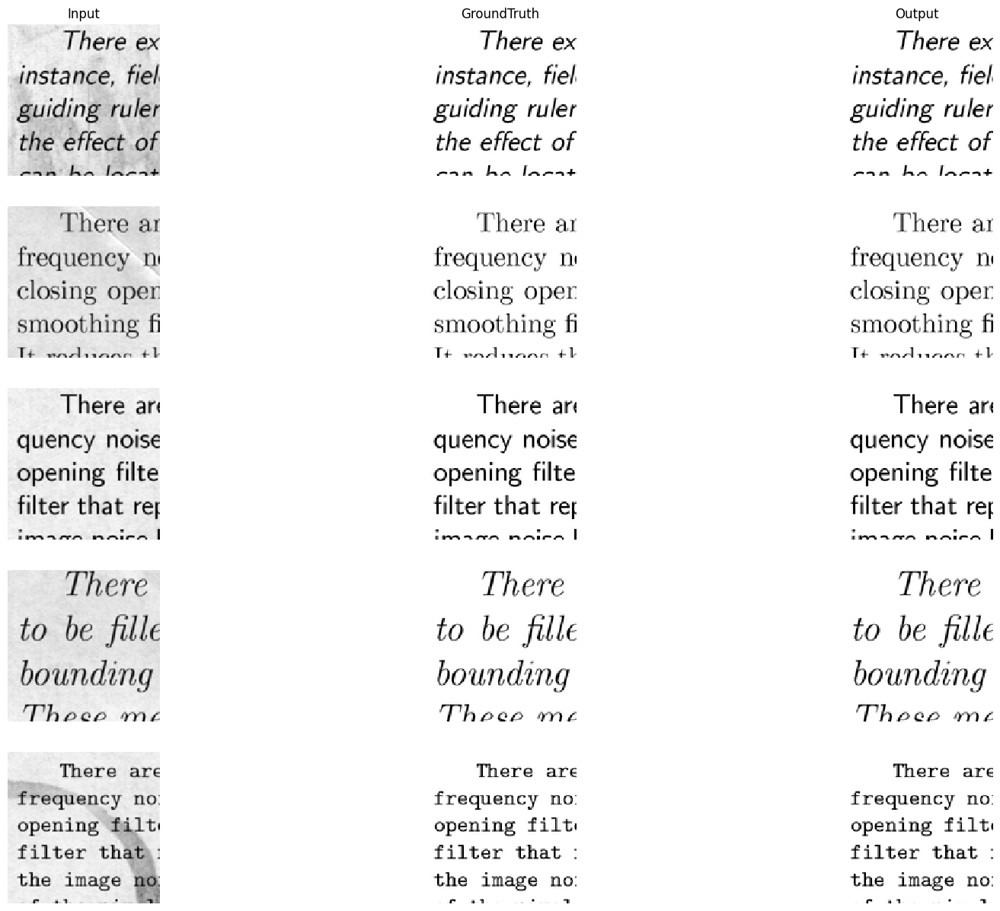

In [32]:
input_imgs, gt_imgs, output_imgs = [], [], []

#begin_solution

# Plot images from the original dataset not from the augmented dataset that was created
# above before in the training loop
input_imgs_path = os.path.join(dataset_path,"Denoising/input_noisy_images/")
cleaned_imgs_path = os.path.join(dataset_path,"Denoising/target_clean_images/")

# Uncomment the 2 lines below to plot images from the augmented dataset. In order for
# this to run, the previous cell must have already ran.
# input_imgs_path = os.path.join(dataset_path, AUGMENTED_INPUT_DATASET_PATH)
# cleaned_imgs_path = os.path.join(dataset_path, AUGMENTED_CLEANED_DATASET_PATH)
dataset = DenoisingDB(input_imgs_path, cleaned_imgs_path)

with torch.no_grad():
    denoiser.eval()
    for i in range(5):
        input_img, cleaned_img = dataset[i]
        input_img = input_img.unsqueeze(0).to(device)
        cleaned_img = cleaned_img.unsqueeze(0).to(device)
        pred = denoiser(input_img)

        input_imgs.append(input_img)
        gt_imgs.append(cleaned_img)
        output_imgs.append(pred)

input_imgs = torch.cat(input_imgs, dim=0).cpu()
gt_imgs = torch.cat(gt_imgs, dim=0).cpu()
output_imgs = torch.cat(output_imgs, dim=0).cpu()

input_imgs = np.reshape(input_imgs, (input_imgs.shape[0], input_imgs.shape[2], input_imgs.shape[3]))
gt_imgs = np.reshape(gt_imgs, (gt_imgs.shape[0], gt_imgs.shape[2], gt_imgs.shape[3]))
output_imgs = np.reshape(output_imgs, (output_imgs.shape[0], output_imgs.shape[2], output_imgs.shape[3]))

#end_solution

titles = ['Input', 'GroundTruth', 'Output']
plot_images_with_text([input_imgs, gt_imgs, output_imgs],titles,texts=None)


In [33]:
dataset = DenoisingDB(input_imgs_path,cleaned_imgs_path)

images = [dataset[i][0].to(device) for i in range(5)]
targets = [dataset[i][1].to(device) for i in range(5)]
images_ae = []
images_gauss = []

#begin_solution

with torch.no_grad():
    denoiser.eval()
    for image in images:
        image = image.unsqueeze(0)
        pred = denoiser(image)
        images_ae.append(pred)

    for image in images:
        image = image.cpu()
        image = np.reshape(image, (image.shape[1], image.shape[2], image.shape[0]))
        pred = denoise_gauss(image)
        pred = np.reshape(pred, (pred.shape[0], pred.shape[1]))
        images_gauss.append(pred)

images_ae = torch.cat(images_ae, dim=0).cpu()
images_ae = np.reshape(images_ae, (images_ae.shape[0], images_ae.shape[2], images_ae.shape[3]))
images_ae = np.array(images_ae)

#end_solution


In [34]:
imgs_plot = [ el.detach().squeeze().cpu().numpy() for el in images]
tgts_plot = [ el.detach().squeeze().cpu().numpy() for el in targets]

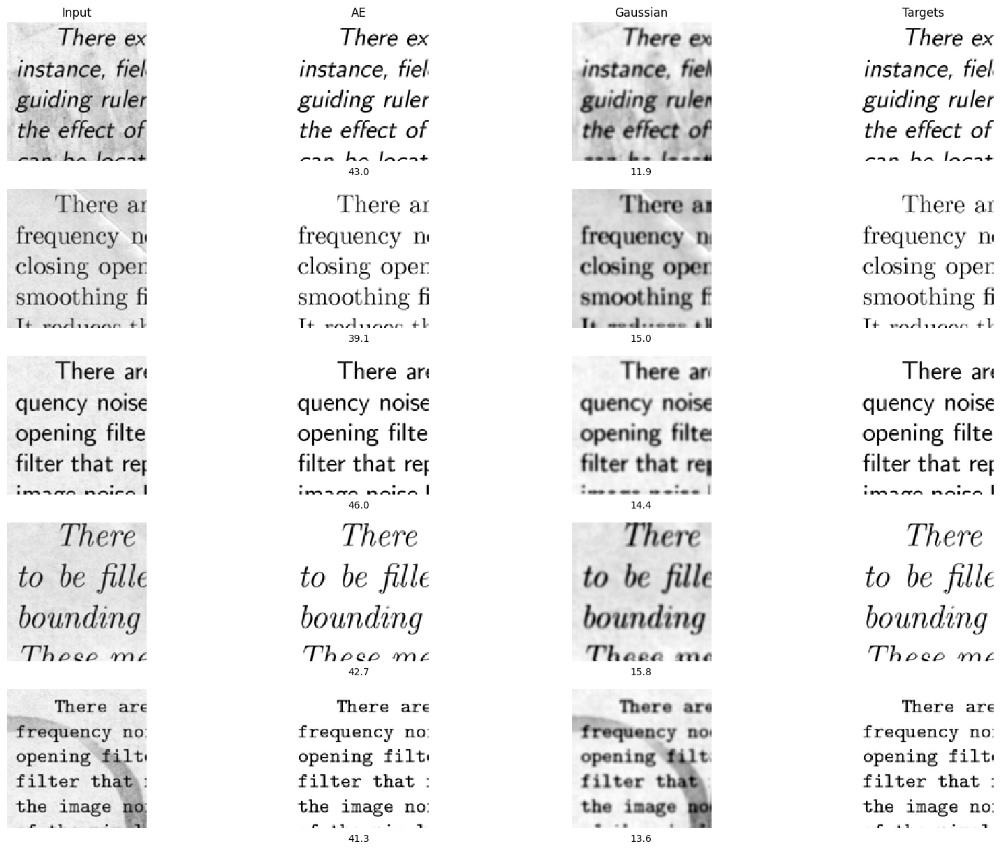

In [35]:
psnrs = [ 0.0 for el in targets ]
for i in range(len(tgts_plot)):
    psnr_ae    = peak_signal_noise_ratio(tgts_plot[i], images_ae[i])
    pnsr_gauss = peak_signal_noise_ratio(tgts_plot[i], images_gauss[i])
    psnrs[i] = ['', psnr_ae, pnsr_gauss, '']

img = [imgs_plot, images_ae, images_gauss, tgts_plot]
titles = ['Input', 'AE', 'Gaussian', 'Targets']
texts = psnrs
plot_images_with_text(img, titles, texts)
plt.show()

## 5. Implicit Neural Representation (30 points)
The objective here is to learn an implicit neural function to predict frames of an animated 2D object. That is, learn a function $f(x,y,t; \theta)$, where $\theta$ are learnable MLP weights, that takes as input pixel coordinates $x,y$ and time $t$ and predicts the pixel value at that location and time. The learned function should then be able to generate frames of the video at any given instance $t$. The task is divided into multiple incremental blocks as below:

[a)](#question5a) Fit an MLP model to a _single_ image. **(5 points)**

[b)](#question5b) Add positional encoding of pixels to improve prediction. **(5 points)**

[c)](#question5c) Adapt the framework to train an MLP to fit a sequence of frames instead of a single frame. **(8 points)**

[d)](#question5d) Fit the MLP to the sequence of frames with and without positional encoding on time, and report the result for both **(2 points)**

[e)](#question5e) Implement batching, to prevent memory issues when evaluating large number of pixels with the MLP. Size of a batch should not exceed 16000 **(5 points)**

[f)](#question5f) Generate a video of 100 frames uniformly sampled between the first and last frame. Since you trained on only 11 frames, by generating 100 frames you're interpolating unseen video frames. If your method works correctly, it should produce a continuous motion. If you overfit on the training frames, then it would give a discontinuous or jagged motion **(5 points)**


In [36]:
!wget 'https://upload.wikimedia.org/wikipedia/commons/0/07/The_Horse_in_Motion-anim.gif'

X = np.zeros((11,230,340),dtype=np.uint8)
with imageio.get_reader('The_Horse_in_Motion-anim.gif') as r:
    for i in range(11):
        X[i] = r.get_data(i)
        X[i,0:20] = 255
        X[i,200:] = 255
        X[i,:,300:] = 255
        X[i,:,:10] = 255

X_resized = np.stack([cv2.resize(X[k], (128,128), cv2.INTER_AREA) for k in range(X.shape[0])], axis=0)
for i in range(X_resized.shape[0]):
  X_resized[i] = np.where(X_resized[i]>60,0,1)

--2023-11-13 14:22:11--  https://upload.wikimedia.org/wikipedia/commons/0/07/The_Horse_in_Motion-anim.gif
Resolving upload.wikimedia.org (upload.wikimedia.org)... 

2a02:ec80:300:ed1a::2:b, 185.15.59.240
Connecting to upload.wikimedia.org (upload.wikimedia.org)|2a02:ec80:300:ed1a::2:b|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 648978 (634K) [image/gif]
Saving to: ‘The_Horse_in_Motion-anim.gif’

The_Horse_in_Motion 100%[===================>] 633.77K  --.-KB/s    in 0.1s    

2023-11-13 14:22:12 (6.11 MB/s) - ‘The_Horse_in_Motion-anim.gif’ saved [648978/648978]



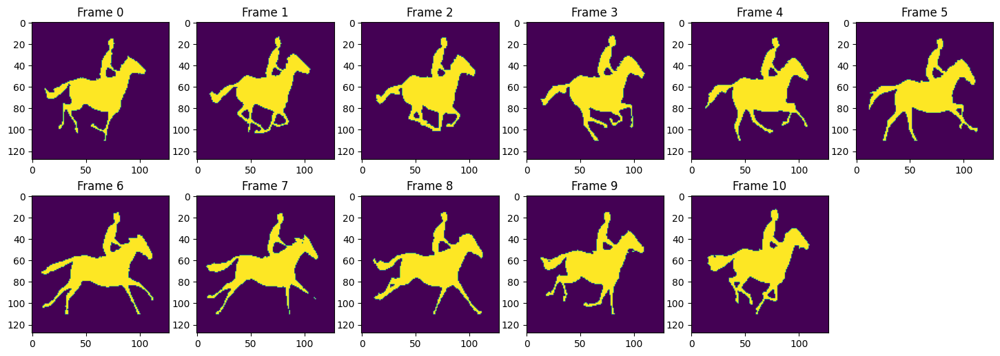

In [37]:
plt.figure(figsize=(6*3,2*3))
for i in range(11):
    plt.subplot(2,6,i+1)
    plt.imshow(X_resized[i])
    plt.title(f'Frame {i}')
plt.show()
plt.close()

In [38]:
output_path = 'input_bw_video.mp4'
with imageio.get_writer(output_path, mode='I', fps=10) as writer:
        for k in range(X_resized.shape[0]):
            writer.append_data(255*X_resized[k])
Video(output_path)

In [39]:
def plot_implicit_representation_single_image(image, model, device='cuda'):

    '''
    Visualize implicit representation of image from training the MLP model

    Args:
        - image TORCHFLOAT32 (H,W)
        - model MLP model which takes as input batches (BATCH,K) and return pixel prediction of dim (BATCH,1)
    '''

    with torch.no_grad():
        U = predict_image(image, model, device='cuda')
    U = U.reshape((1,image.shape[0],image.shape[1]))
    U_bw = (U>0.5).type(torch.int32).cpu()

    plt.figure(figsize=(12,6))

    plt.subplot(1,3,1)
    plt.title('Implicit rep.')
    plt.imshow(U[0].cpu().numpy())
    plt.colorbar()
    plt.clim(0,1)

    plt.subplot(1,3,2)
    plt.imshow(U_bw[0].cpu().numpy())
    plt.title('Prediction')

    plt.subplot(1,3,3)
    plt.imshow(image.cpu())
    plt.title('Ground truth')

def plot_implicit_representation_multi_images(images, model, device='cuda'):

    '''
    Visualize implicit representation of a set of images from training the MLP model

    Args:
        - images TORCHFLOAT32 (N,H,W)
        - model MLP model which takes as input batches (BATCH,K) and return pixel prediction of dim (BATCH,1)
    '''

    with torch.no_grad():
        U = predict_images(images, model, device='cuda')
    U = U.reshape((images.shape[0],images.shape[1],images.shape[2])).cpu()
    U_bw = (U>0.5).type(torch.int32).cpu()

    for i in range(images.shape[0]):

        plt.figure(figsize=(12,6))

        plt.subplot(1,3,1)
        plt.title('Implicit rep.')
        plt.imshow(U[i].cpu().numpy())
        plt.colorbar()
        plt.clim(0,1)

        plt.subplot(1,3,2)
        plt.imshow(U_bw[i].cpu().numpy())
        plt.title('Prediction')

        plt.subplot(1,3,3)
        plt.imshow(images[i].cpu())
        plt.title(f'Ground truth Frame {i}')

def plot_loss_and_accuracy(loss_list,accuracy_list):
    plt.figure(figsize=(8*2,6))

    plt.subplot(1,2,1)
    plt.plot([x[0] for x in loss_list], [x[1] for x in loss_list])
    plt.title('Training loss')
    plt.xlabel('epochs')

    plt.subplot(1,2,2)
    plt.plot([x[0] for x in accuracy_list], [x[1] for x in accuracy_list])
    plt.title('Accuracy')
    plt.ylim(0.,1.)
    plt.xlabel('epochs')

**Question 5a**
<a name='question5a'></a>

Fit an MLP model to a single image

In [40]:
class MLP(nn.Module):
    '''
    MLP class
    '''
    def __init__(self,input_dimension, nb_layers, embedding_dimension, output_dimension):
        super(MLP, self).__init__()

        #begin_solution

        self.input_dimension = input_dimension
        self.nb_layers = nb_layers
        self.embedding_dimension = embedding_dimension
        self.output_dimension = output_dimension

        self.layers = nn.ModuleList()
        self.layers.append(nn.Linear(self.input_dimension, self.embedding_dimension))

        for _ in range(self.nb_layers):
            self.layers.append(nn.Linear(self.embedding_dimension, self.embedding_dimension))

        self.layers.append(nn.Linear(self.embedding_dimension, self.output_dimension))

        #end_solution


    def forward(self, input):
        #begin_solution

        prediction = input
        for layer in self.layers:
            prediction = layer(prediction)
            prediction = torch.relu(prediction)

        #end_solution

        return prediction

Write a function which samples random pixel positions in an image

In [41]:
## Sample random pixel positions
def sample_image(image, n, scaled=True):
    '''
    Args:
        - image TORCHINT32 (H, W)
        - n : int, number of positions to sample
        - scaled: bool, if True, divide by the dimension
    Returns:
        - sampled_positions TORCHFLOAT32 ((n,2)), sampled positions
        - pixel_values TORCHINT32((n,)), sampled pixel values
    '''

    #begin_solution

    # Test x, y coordinates to figure out how to index into image
    # x = 12, y = 63 then pixel value is 1

    H, W = image.shape
    sampled_positions = []
    pixel_values = []

    # Randomly generate n positions (x, y)
    for _ in range(n):
        x = random.randint(0, H-1)
        y = random.randint(0, W-1)

        # Get the pixel value at (x, y)
        pixel_value = int(image[y, x])
        pixel_values.append(pixel_value)

        x = x / H if scaled else x
        y = y / W if scaled else y

        sampled_positions.append([x, y])

    sampled_positions = torch.FloatTensor(sampled_positions)
    pixel_values = torch.IntTensor(pixel_values)

    #end_solution


    return sampled_positions, pixel_values


Write a function that takes and image and a trained MLP and predicts all pixel values of the image. That is, for every $x,y$ in the given image, predict its pixel value with the MLP.

In [55]:
def predict_image(image, model, device='cuda', scale=True):
    '''
    Reconstruct the complete set of images from the overfitted MLP model

    Args:
        - images TORCH_INT32 (H, W)
        - model, takes as input a batch of pixel positions and return pixel value
    Return:
        - prediction TORCHFLOAT32 (H, W) [CPU]
    '''

    #begin_solution

    H, W = image.shape
    positions = []

    # Create a list of positions (x, y) across H and W
    for i in range(H):
        for j in range(W):
            x = i / H if scale else i
            y = j / W if scale else j
            positions.append([y, x])

    positions = torch.FloatTensor(positions)#.to(device)
    with torch.no_grad():
        model.eval()
        prediction = model(positions)

    # Don't yet set pixel values to 0 or 1 in prediction. Else,
    # plotting functions won't plot implicit representation properly
    # prediction[prediction < 0.5] = 0
    # prediction[prediction >= 0.5] = 1

    prediction = prediction.reshape((H, W))
    prediction = prediction.cpu()

    #end_solution


    return prediction

Write a function to evaluate the model's prediction performance

In [43]:
## Compute accuracy over the set of frames
def eval_accuracy(image, model, device='cuda'):
    '''
    Args:
        - images TORCH_INT32 (H, W)
        - model, takes as input a batch of pixel positions and return pixel value
    Return:
        - mean_accuracy FLOAT32
    '''

    #begin_solution

    image = image.to(device)
    H, W = image.shape
    positions = []

    for i in range(H):
        for j in range(W):
            x = i / H
            y = j / W
            positions.append([y, x])

    positions = torch.FloatTensor(positions).to(device)
    with torch.no_grad():
        model.eval()
        prediction = model(positions)

    # Must convert pixel values to 0 or 1 for correct accuracy calculation
    # as image is of type torch.int32 and has strictly 0 or 1 values
    prediction[prediction < 0.5] = 0
    prediction[prediction >= 0.5] = 1
    prediction = prediction.reshape((H, W))

    accuracy = (prediction == image).sum() / (H * W)
    accuracy = accuracy.item()

    #end_solution


    return accuracy

Write the training loop. Train for a suitable number of epochs and while training populate the lists loss_list and accuracy_list with scalar values. These lists can be used for plotting later.

In [ ]:
loss_list, accuracy_list = [], []

#begin_solution

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

model = MLP(input_dimension=2, nb_layers=4, embedding_dimension=128, output_dimension=1).to(device)
criterion = nn.MSELoss()
optimizer = optim.Adam(model.parameters(), lr=0.001)
scheduler = optim.lr_scheduler.StepLR(optimizer, step_size=10, gamma=0.75)

# Batch was introduced to only calculate accuracy epochs (100) number
# of times and not epochs * batch (50000) times. Could just use epochs and set it to 50000,
# however, because eval_accuracy() is time consuming, it would siginificantly increase training time.
num_epochs = 100
batch = 500
sample_size = 200

# Test image to overfit the model on
image = torch.tensor(X_resized[0], dtype=torch.float32).to(device)

for epoch in range(num_epochs):
    model.train()
    running_loss = 0.0

    for idx in range(batch):
        optimizer.zero_grad()
        sampled_positions, pixel_values = sample_image(image, sample_size)
        sampled_positions = sampled_positions.to(device)
        pixel_values = pixel_values.to(device)

        prediction = model(sampled_positions)
        prediction = prediction.reshape(pixel_values.shape).to(device)
        pixel_values = pixel_values.type(torch.FloatTensor).to(device)
        loss = criterion(pixel_values, prediction)

        # Penalty loss measures how many pixels values are 0 in the prediction (ie. how black the image is)
        # If image is completely black, accuracy would be around 83%, hence the model could get stuck in a
        # local minima and not learn anything. Penalty loss penalises the model for only predicting black pixels.
        # On rare occasions, penalty loss stays constant at 1.0 due to the randomness of sample_image(). To
        # resolve this, simply re-run the training cell (or set random seed to a fixed value where this doesn't occur).
        penalty_loss = 1 - torch.mean(torch.abs(prediction))
        penalty_loss = penalty_loss if penalty_loss > 0.95 else 0
        loss += 0.1 * penalty_loss

        running_loss += loss.item()
        loss.backward()
        optimizer.step()

        if (idx + 1) % 100 == 0:
            print(f"Epoch [{epoch + 1}/{num_epochs}], Batch [{idx + 1}/{batch}], Loss: {loss}, Penalty Loss: {penalty_loss}, Learning Rate: {scheduler.get_last_lr()[0]}")

    # Only calculate the accuracy at the end of each epoch to save time. For a more accurate loss metrics,
    # the average loss per epoch is calculated instead of taking the last loss value of the batch.
    loss_list.append((epoch, running_loss / batch))
    accuracy = eval_accuracy(image, model, device)
    accuracy_list.append((epoch, accuracy))
    scheduler.step()
    print(f"-------------------Epoch [{epoch + 1}/{num_epochs}], Average loss: {running_loss / batch}, Accuracy: {accuracy}-------------------\n")

    if accuracy > 0.999:
        break

# Currently, training consists of 50000 iterations and takes around TODO seconds. Accuracy reaches 0.998 on the
# test image. This could be improved by increasing the sample size to the 1000s (200 is on the lower side), however,
# this would increase training time without much added benefit (ie. accuracy increase of 0.001). Interesting to note,
# the final accuracy is independent of most hyperparameters with embedding_dimensions being the most important one.
# For example, if embedding_dimensions is set to 16, the final accuracy is only 0.97 which equates to a 'blob' in the prediction.

#end_solution


Epoch [1/100], Batch [100/500], Loss: 0.05398941412568092, Penalty Loss: 0, Learning Rate: 0.001
Epoch [1/100], Batch [200/500], Loss: 0.05653020739555359, Penalty Loss: 0, Learning Rate: 0.001
Epoch [1/100], Batch [300/500], Loss: 0.0358603410422802, Penalty Loss: 0, Learning Rate: 0.001
Epoch [1/100], Batch [400/500], Loss: 0.05179915204644203, Penalty Loss: 0, Learning Rate: 0.001
Epoch [1/100], Batch [500/500], Loss: 0.043487586081027985, Penalty Loss: 0, Learning Rate: 0.001
-------------------Epoch [1/100], Average loss: 0.05482671576365829, Accuracy: 0.9410400390625-------------------

Epoch [2/100], Batch [100/500], Loss: 0.06218760460615158, Penalty Loss: 0, Learning Rate: 0.001
Epoch [2/100], Batch [200/500], Loss: 0.04855121672153473, Penalty Loss: 0, Learning Rate: 0.001
Epoch [2/100], Batch [300/500], Loss: 0.029774729162454605, Penalty Loss: 0, Learning Rate: 0.001
Epoch [2/100], Batch [400/500], Loss: 0.03901408985257149, Penalty Loss: 0, Learning Rate: 0.001
Epoch [2/10

Save the model (needed for marking)

In [ ]:
if not os.path.exists("models/"):
  os.makedirs("./models/")
torch.save({"model":model}, "models/implicit_single_image.pth")

Load the trained model

In [44]:
state_dict = torch.load("models/implicit_single_image.pth")
model = state_dict["model"].to(device)

Let's plot our performance

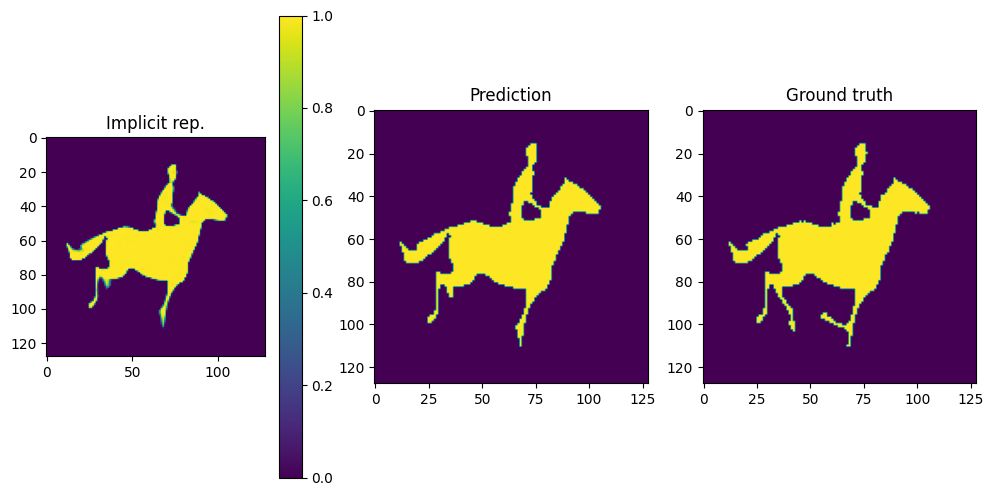

In [49]:
plot_loss_and_accuracy(loss_list,accuracy_list)
plot_implicit_representation_single_image(image, model, device='cuda')

**Question 5b**
<a name='question5b'></a>

Add positional encoding of pixels to improve predictions.

Write a function that positionally encodes the input.

In [51]:
def positional_embedding_power_ls(X,L, cst=torch.pi):
    #begin_solution

    N = X.shape[0]
    K = X.shape[1]
    cos_encoding = torch.zeros((N, L)).to(device)
    sin_encoding = torch.zeros((N, L)).to(device)

    # Formula used is from the lecture slides on Positional Encoding (Slide 36, Week 5, Part 2)
    for i in range(N):
        for j in range(L):
            for k in range(K):
                cos_encoding[i, j] += torch.cos(cst * (2 ** j) * X[i, k])
                sin_encoding[i, j] += torch.sin(cst * (2 ** j) * X[i, k])

    #end_solution

    return torch.cat([cos_encoding,sin_encoding], axis=-1)

Write a new MLP, while reusing the previous MLP model, that can predict using the positionally encoded pixel locations.

In [52]:
class MLP_PE(nn.Module):
    '''
    MLP with positional encoding class
    '''
    def __init__(self,input_dimension, nb_layers, embedding_dimension, output_dimension, positional_enc_L=0):
        super(MLP_PE, self).__init__()
        #begin_solution

        # The value 2 comes from calculating both the cos and sin positional encoding
        self.positional_enc_L = positional_enc_L
        self.positional_enc_dim = 2 * self.positional_enc_L
        self.input_dimension = input_dimension + self.positional_enc_dim
        self.MLP = MLP(self.input_dimension, nb_layers, embedding_dimension, output_dimension)

        #end_solution


    def forward(self, input):

        #begin_solution

        # Extend input dimensions with positional encoding
        positional_enc = positional_embedding_power_ls(input, self.positional_enc_L)
        input = torch.cat([input, positional_enc], axis=-1)
        prediction = self.MLP(input)

        #end_solution


        return prediction

Write the training loop similar to before. Train for a suitable number of epochs and while training populate the lists loss_list and accuracy_list with scalar values. These lists can be used for plotting later.

In [75]:
loss_list, accuracy_list = [], []

#begin_solution

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

model = MLP_PE(input_dimension=2, nb_layers=4, embedding_dimension=128, output_dimension=1, positional_enc_L=2).to(device)
criterion = nn.MSELoss()
optimizer = optim.Adam(model.parameters(), lr=0.001)
scheduler = optim.lr_scheduler.StepLR(optimizer, step_size=10, gamma=0.75)

# Batch was introduced to only calculate accuracy epochs (100) number
# of times and not epochs * batch (50000) times. Could just use epochs and set it to 50000,
# however, because eval_accuracy() is time consuming, it would siginificantly increase training time.
num_epochs = 100
batch = 50
sample_size = 200

# Test image to overfit the model on
image = torch.tensor(X_resized[0], dtype=torch.float32).to(device)

for epoch in range(num_epochs):
    model.train()
    running_loss = 0.0

    for idx in range(batch):
        optimizer.zero_grad()
        sampled_positions, pixel_values = sample_image(image, sample_size)
        sampled_positions = sampled_positions.to(device)
        pixel_values = pixel_values.to(device)

        prediction = model(sampled_positions)
        prediction = prediction.reshape(pixel_values.shape).to(device)
        pixel_values = pixel_values.type(torch.FloatTensor).to(device)
        loss = criterion(pixel_values, prediction)

        # Penalty loss measures how many pixels values are 0 in the prediction (ie. how black the image is)
        # If image is completely black, accuracy would be around 83%, hence the model could get stuck in a
        # local minima and not learn anything. Penalty loss penalises the model for only predicting black pixels.
        # On rare occasions, penalty loss stay constant at 1.0 due to the randomness of sample_image(). To
        # resolve this, simply re-run the training cell (or set random seed to a fixed value where this doesn't occur).
        penalty_loss = 1 - torch.mean(torch.abs(prediction))
        penalty_loss = penalty_loss if penalty_loss > 0.95 else 0
        loss += 0.1 * penalty_loss

        running_loss += loss.item()
        loss.backward()
        optimizer.step()

        if (idx + 1) % 10 == 0:
            print(f"Epoch [{epoch + 1}/{num_epochs}], Batch [{idx + 1}/{batch}], Loss: {loss}, Penalty Loss: {penalty_loss}, Learning Rate: {scheduler.get_last_lr()[0]}")

    # Only calculate the accuracy at the end of each epoch to save time. For a more accurate loss metrics,
    # the average loss per epoch is calculated instead of taking the last loss value of the batch.
    loss_list.append((epoch, running_loss / batch))
    accuracy = eval_accuracy(image, model, device)
    accuracy_list.append((epoch, accuracy))
    scheduler.step()
    print(f"-------------------Epoch [{epoch + 1}/{num_epochs}], Average loss: {running_loss / batch}, Accuracy: {accuracy}-------------------\n")

    if accuracy > 0.999:
        break

# Training with positional encoding only needs of 30000 iterations to reach 0.998 accuracy and eventually reaches,
# 0.999 accuracy. While accuracy is similar to the model without positional encoding, positional encoding ensures
# sharp and small patterns are captured. Change in such high frequency details isn't appropriately reflected in
# the loss or accuracy metrics, however, it can be seen that the prediction with positional encoding below if more
# accurate. For example, now both rear legs are shown in the prediction, while the model without positional encoding
# only shows one of them.

#end_solution


Epoch [1/100], Batch [10/50], Loss: 0.08787482231855392, Penalty Loss: 0, Learning Rate: 0.001
Epoch [1/100], Batch [20/50], Loss: 0.07795204222202301, Penalty Loss: 0, Learning Rate: 0.001
Epoch [1/100], Batch [30/50], Loss: 0.07620827108621597, Penalty Loss: 0, Learning Rate: 0.001
Epoch [1/100], Batch [40/50], Loss: 0.05875010043382645, Penalty Loss: 0, Learning Rate: 0.001
Epoch [1/100], Batch [50/50], Loss: 0.06940939277410507, Penalty Loss: 0, Learning Rate: 0.001
-------------------Epoch [1/100], Average loss: 0.07539351023733616, Accuracy: 0.91650390625-------------------

Epoch [2/100], Batch [10/50], Loss: 0.05532199889421463, Penalty Loss: 0, Learning Rate: 0.001
Epoch [2/100], Batch [20/50], Loss: 0.0591839961707592, Penalty Loss: 0, Learning Rate: 0.001
Epoch [2/100], Batch [30/50], Loss: 0.08153069019317627, Penalty Loss: 0, Learning Rate: 0.001
Epoch [2/100], Batch [40/50], Loss: 0.04582623392343521, Penalty Loss: 0, Learning Rate: 0.001
Epoch [2/100], Batch [50/50], Los

Save the model (needed for marking)

In [ ]:
if not os.path.exists("models/"):
  os.makedirs("./models/")
torch.save({"model":model}, "models/implicit_single_image_positional_encoding.pth")

Load the trained model

In [53]:
state_dict = torch.load("models/implicit_single_image_positional_encoding.pth")
model = state_dict["model"].to(device)

Let's plot our performance.

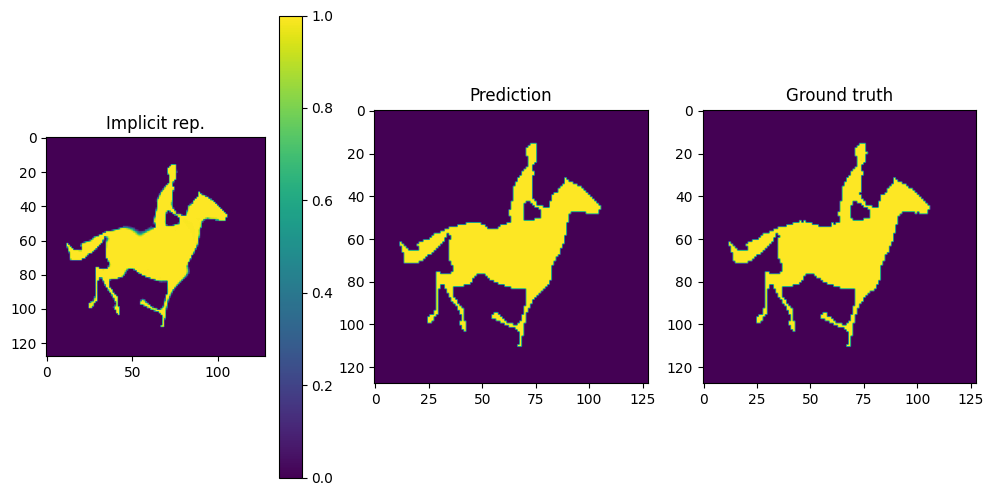

In [56]:
plot_loss_and_accuracy(loss_list,accuracy_list)
plot_implicit_representation_single_image(image, model, device='cuda')

**Question 5c**
<a name='question5c'></a>

Adapt the framework to train an MLP to fit a sequence of frames instead of a single frame. You'd need to rewrite image sampling and other functions to achieve this.

Write a function that can now also sample across the time dimension.

In [57]:
def sample_images(images, n, scaled=True):
    '''
    Args:
        - images TORCHINT32 (N_frames, H, W)
        - n : int, number of positions to sample
        - scaled: bool, if True, divide by the dimension
    Returns:
        - sampled_positions TORCHFLOAT32 ((n,3)), sampled positions
        - pixel_values TORCHINT32((n,)), sampled pixel values
    '''

    #begin_solution

    N_frames, H, W = images.shape
    sampled_positions = []
    pixel_values = []

    # Randomly select frame index, x, and y coordinates
    for _ in range(n):
        frame_index = random.randint(0, N_frames - 1)
        x = random.randint(0, W - 1)
        y = random.randint(0, H - 1)

        # Get the pixel value at (x, y, t)
        pixel_value = images[frame_index, y, x]
        pixel_values.append(int(pixel_value))

        x = x / W if scaled else x
        y = y / H if scaled else y
        frame_index = frame_index / N_frames if scaled else frame_index

        sampled_positions.append([x, y, frame_index])

    sampled_positions = torch.FloatTensor(sampled_positions)
    pixel_values = torch.IntTensor(pixel_values)

    #end_solution

    return sampled_positions, pixel_values


Write a function to predict the images, now also across time.

In [63]:
def predict_images(images, model, device='cuda', scale=True):
    '''
    Reconstruct the complete set of images from the overfitted MLP model

    Args:
        - images TORCH_INT32 (N_frames, H, W)
        - model, takes as input a batch of pixel positions (K,2) and return pixel value (K,1)
    Return:
        - prediction TORCHFLOAT32 (N_frames, H, W) [CPU]
    '''
    #begin_solution

    N_frames, H, W = images.shape

    # Create a list of positions (x, y, t) across frames, H, and W
    positions = []
    for t in range(N_frames):
        t = t / N_frames if scale else t
        for i in range(H):
            x = i / H if scale else i
            for j in range(W):
                y = j / W if scale else j
                positions.append([y, x, t])

    positions = torch.FloatTensor(positions)#.to(device)
    with torch.no_grad():
        model.eval()
        prediction = model(positions)

    prediction = prediction.reshape((N_frames, H, W))
    prediction = prediction.cpu()

    #end_solution


    return prediction

Write a function to evaluate performance across time.

In [59]:
## Compute accuracy over the set of frames
def eval_mean_accuracy(images, model, device='cuda'):
    '''
    Args:
        - images TORCH_INT32 (N_frames, H, W)
        - model, takes as input a batch of pixel positions (K,2) and return pixel value (K,1)
    Return:
        - mean_accuracy FLOAT32
    '''
    #begin_solution

    images = images.to(device)
    N_frames, H, W = images.shape
    positions = []

    for t in range(N_frames):
        t = t / N_frames
        for i in range(H):
            x = i / H
            for j in range(W):
                y = j / W
                positions.append([y, x, t])

    positions = torch.FloatTensor(positions).to(device)
    with torch.no_grad():
        model.eval()
        prediction = model(positions)

    # Must convert pixel values to 0 or 1 for correct accuracy calculation
    # as image is of type torch.int32 and has strictly 0 or 1 values
    prediction[prediction < 0.5] = 0
    prediction[prediction >= 0.5] = 1
    prediction = prediction.reshape((N_frames, H, W))

    accuracy = (prediction == images).sum() / (N_frames * H * W)
    accuracy = accuracy.item()

    #end_solution


    return accuracy


Write the training loop similar to before. Train for a suitable number of epochs and while training populate the lists loss_list and accuracy_list with scalar values. These lists can be used for plotting later.

In [ ]:
loss_list, accuracy_list = [], []

#begin_solution

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

model = MLP(input_dimension=3, nb_layers=4, embedding_dimension=128, output_dimension=1).to(device)
optimizer = optim.Adam(model.parameters(), lr=0.001)
criterion = nn.MSELoss()
scheduler = optim.lr_scheduler.StepLR(optimizer, step_size=10, gamma=0.75)

num_epochs = 100
batch = 5000
sample_size = 200

# Sequences of images to train on
images = [torch.tensor(image, dtype=torch.float32).to(device) for image in X_resized]
images = torch.stack(images)

for epoch in range(num_epochs):
    model.train()
    running_loss = 0.0

    for idx in range(batch):
        optimizer.zero_grad()
        sampled_positions, pixel_values = sample_images(images, sample_size)
        sampled_positions = sampled_positions.to(device)
        pixel_values = pixel_values.to(device)

        prediction = model(sampled_positions)
        prediction = prediction.reshape(pixel_values.shape).to(device)
        pixel_values = pixel_values.type(torch.FloatTensor).to(device)
        loss = criterion(pixel_values, prediction)

        # Penalty loss measures how many pixels values are 0 in the prediction (ie. how black the image is)
        # If image is completely black, accuracy would be around 83%, hence the model could get stuck in a
        # local minima and not learn anything. Penalty loss penalises the model for only predicting black pixels.
        # On rare occasions, penalty loss stay constant at 1.0 due to the randomness of sample_image(). To
        # resolve this, simply re-run the training cell (or set random seed to a fixed value where this doesn't occur).
        penalty_loss = 1 - torch.mean(torch.abs(prediction))
        penalty_loss = penalty_loss if penalty_loss > 0.95 else 0
        loss += 0.1 * penalty_loss

        running_loss += loss.item()
        loss.backward()
        optimizer.step()

        if (idx + 1) % 1000 == 0:
            print(f"Epoch [{epoch + 1}/{num_epochs}], Batch [{idx + 1}/{batch}], Loss: {loss}, Penalty Loss: {penalty_loss}, Learning Rate: {scheduler.get_last_lr()[0]}")

    # Only calculate the accuracy at the end of each epoch to save time. For a more accurate loss metrics,
    # the average loss per epoch is calculated instead of taking the last loss value of the batch.
    loss_list.append((epoch, running_loss / batch))
    accuracy = eval_mean_accuracy(images, model, device)
    accuracy_list.append((epoch, accuracy))
    scheduler.step()
    print(f"-------------------Epoch [{epoch + 1}/{num_epochs}], Average loss: {running_loss / batch}, Accuracy: {accuracy}-------------------\n")

    if accuracy > 0.999:
        break

#end_solution


Epoch [1/100], Batch [1000/5000], Loss: 0.03729286417365074, Penalty Loss: 0, Learning Rate: 0.001
Epoch [1/100], Batch [2000/5000], Loss: 0.03698788210749626, Penalty Loss: 0, Learning Rate: 0.001
Epoch [1/100], Batch [3000/5000], Loss: 0.053174056112766266, Penalty Loss: 0, Learning Rate: 0.001
Epoch [1/100], Batch [4000/5000], Loss: 0.02308649756014347, Penalty Loss: 0, Learning Rate: 0.001
Epoch [1/100], Batch [5000/5000], Loss: 0.02960703708231449, Penalty Loss: 0, Learning Rate: 0.001
-------------------Epoch [1/100], Average loss: 0.03913755196388811, Accuracy: 0.9630071520805359-------------------

Epoch [2/100], Batch [1000/5000], Loss: 0.03532711789011955, Penalty Loss: 0, Learning Rate: 0.001
Epoch [2/100], Batch [2000/5000], Loss: 0.025607384741306305, Penalty Loss: 0, Learning Rate: 0.001
Epoch [2/100], Batch [3000/5000], Loss: 0.01989092119038105, Penalty Loss: 0, Learning Rate: 0.001
Epoch [2/100], Batch [4000/5000], Loss: 0.034726325422525406, Penalty Loss: 0, Learning 

Save the model (needed for marking)

In [ ]:
if not os.path.exists("models/"):
  os.makedirs("./models/")
torch.save({"model":model}, "models/implicit_images_sequence.pth")

Load the trained model

In [60]:
state_dict = torch.load("models/implicit_images_sequence.pth")
model = state_dict["model"].to(device)

Let's plot our performance

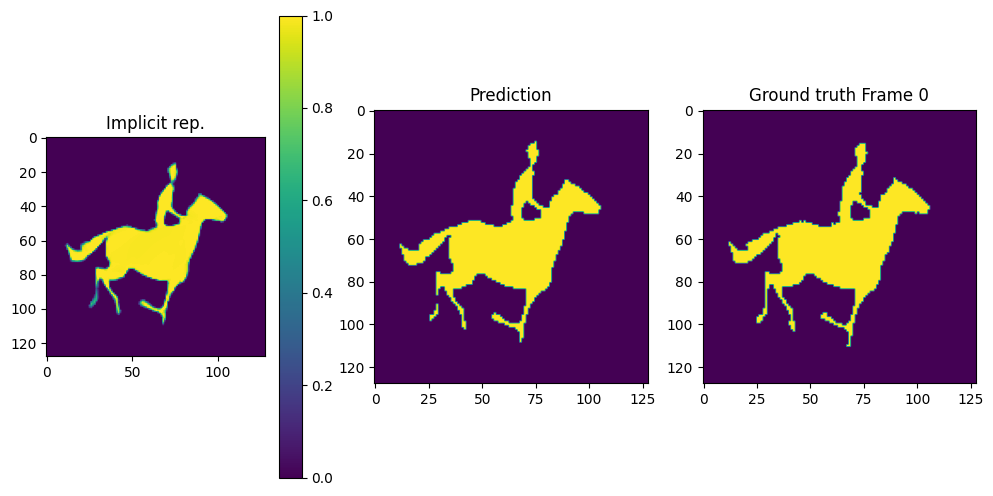

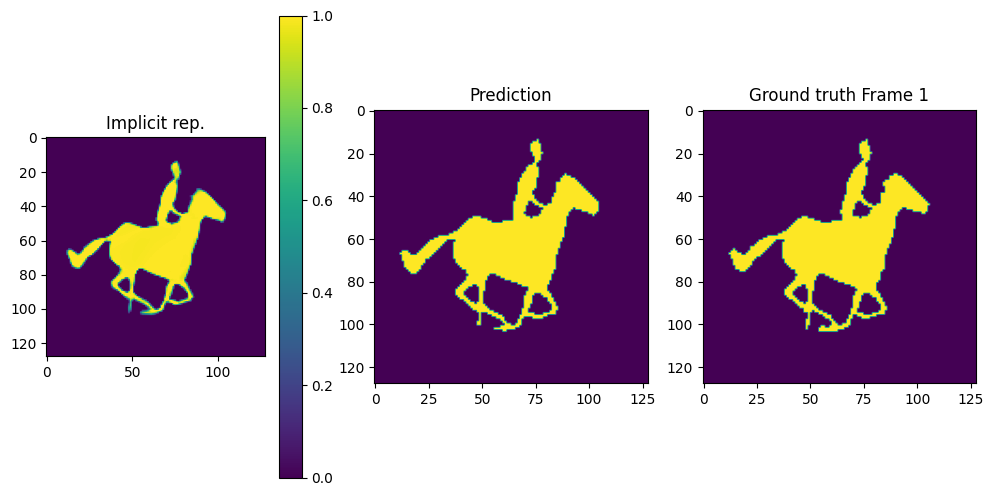

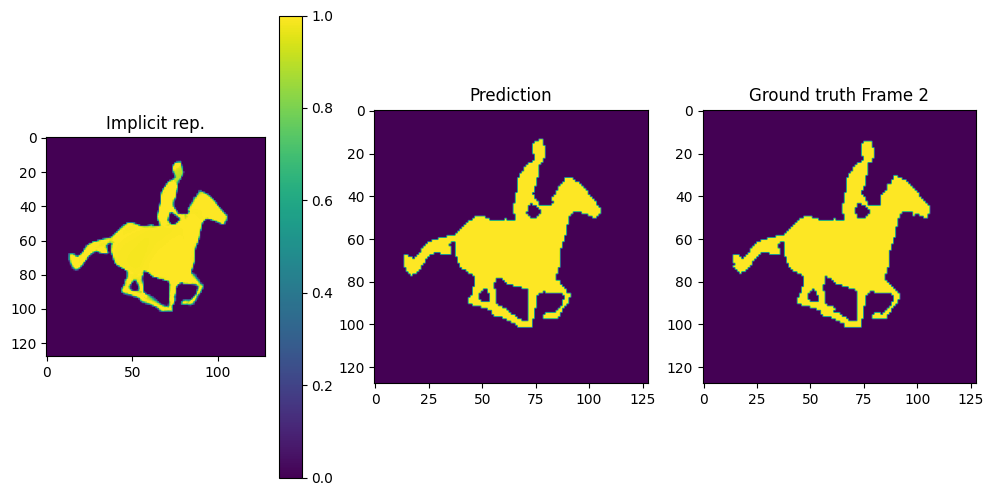

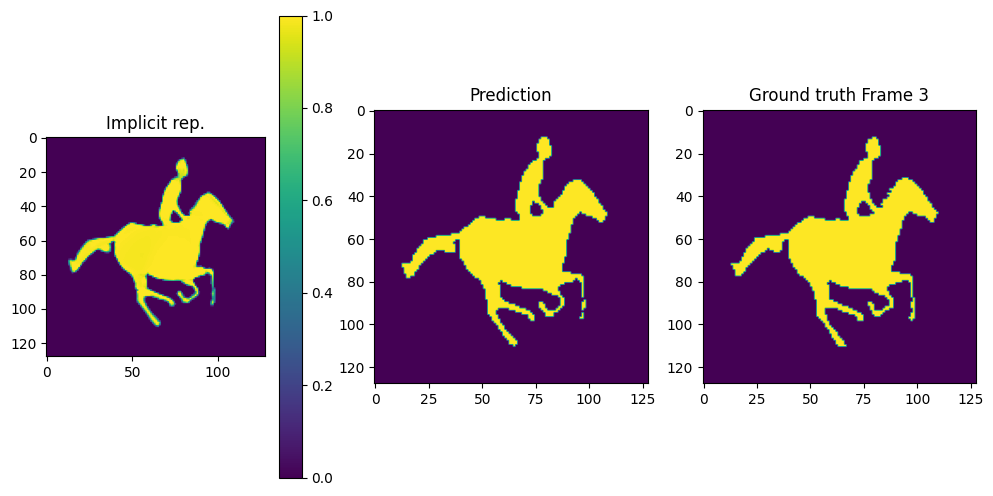

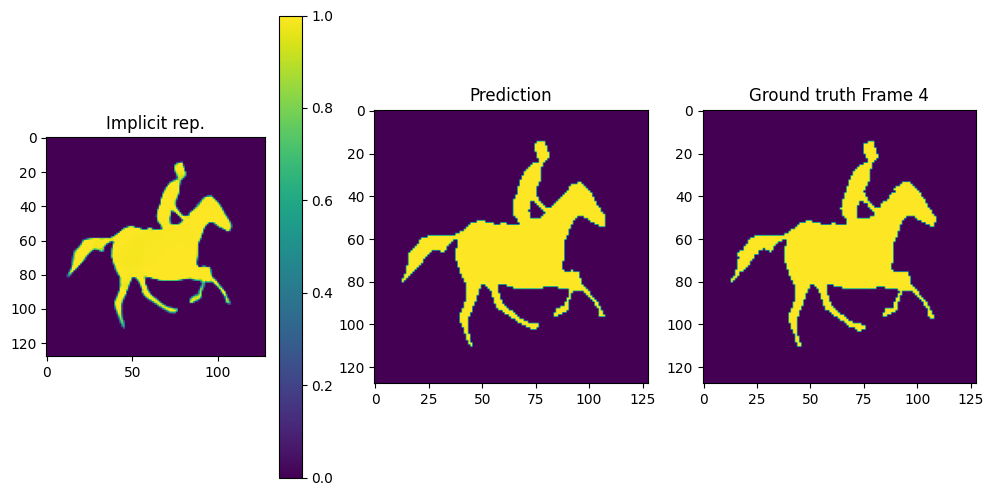

...

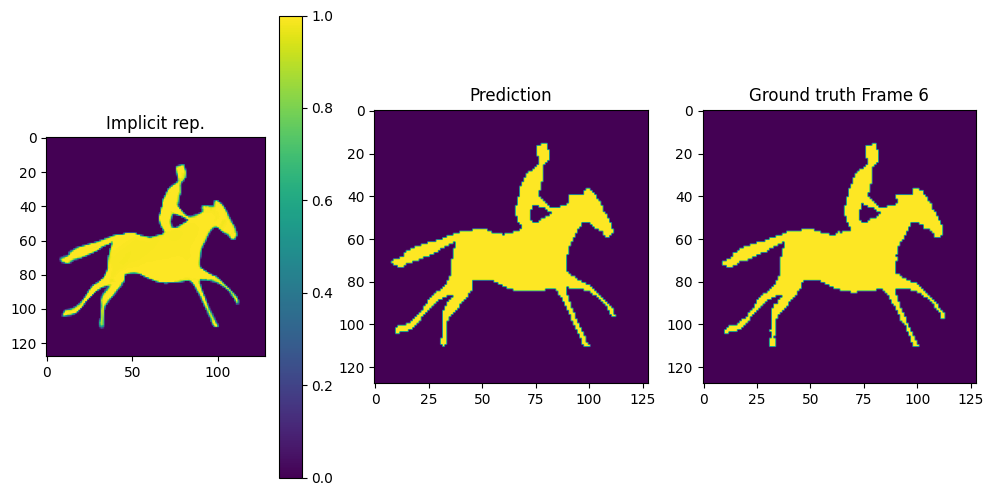

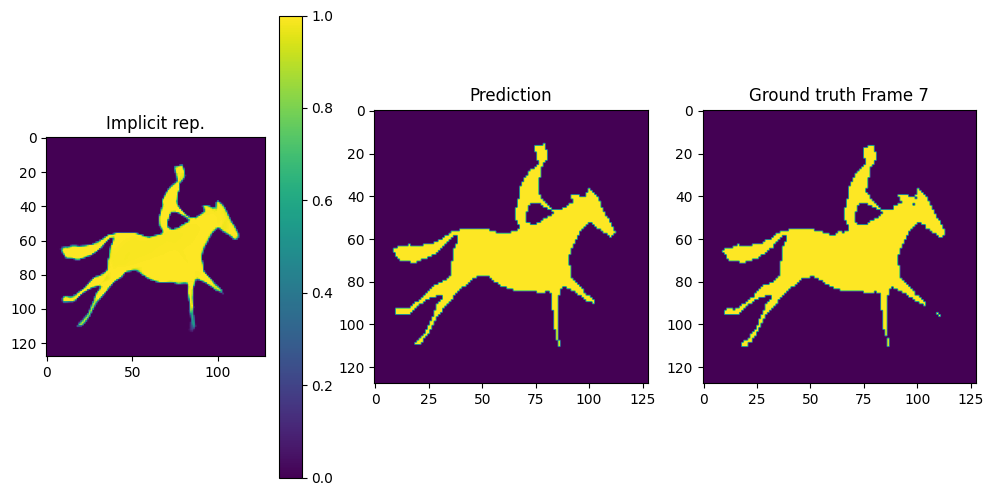

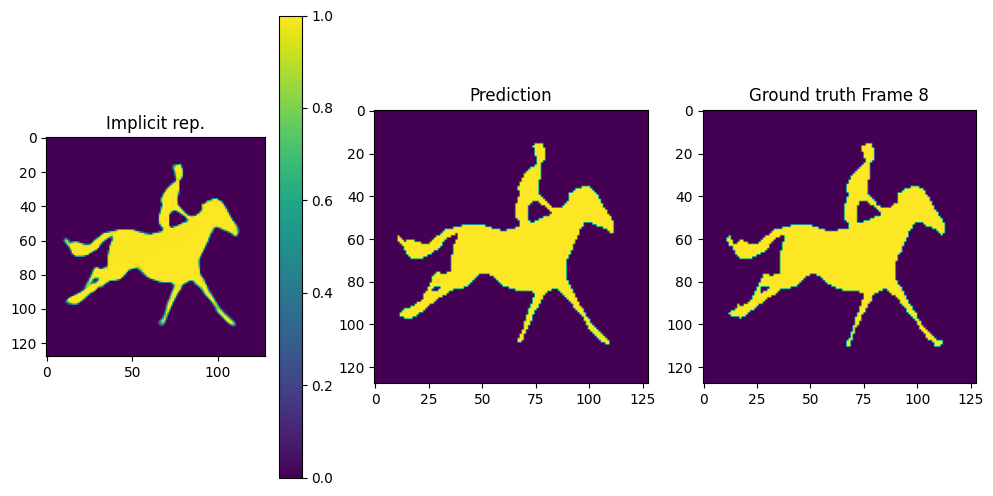

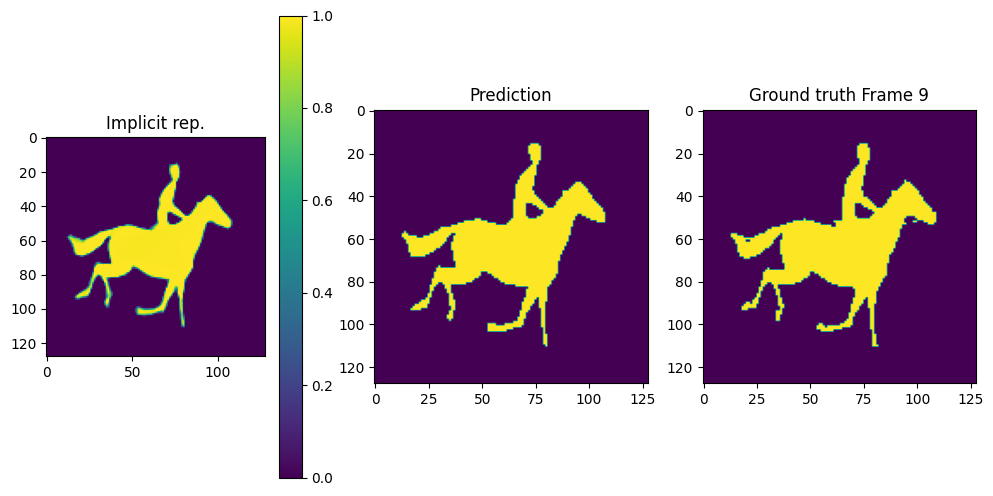

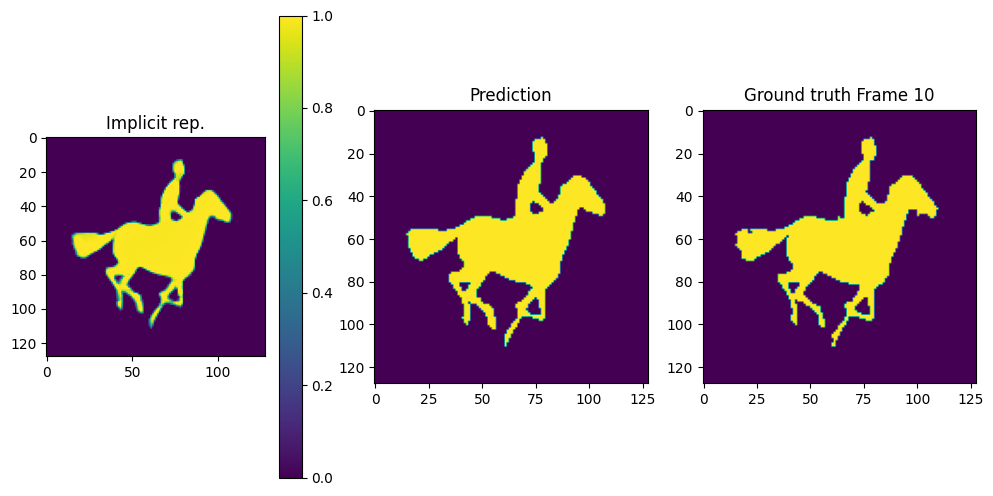

In [64]:
plot_loss_and_accuracy(loss_list,accuracy_list)
plot_implicit_representation_multi_images(images, model, device='cuda')

**Question 5d**
<a name='question5d'></a>

Apply positional encoding for the time dimension.

Write a function that positionally encodes time values, with an optional flag to enable or disable it.

In [65]:
def positional_embedding_power_ls(X,L, cst=torch.pi, encode_time_dimension=True):
    #begin_solution

    # Time is the last dimension in X, so if encode_time_dimension is False, make
    # sure not to include it in the inner loop of the positional encoding calculation
    # by setting K to X.shape[1] instead of X.shape[1] - 1
    N = X.shape[0]
    K = X.shape[1] if encode_time_dimension else X.shape[1] - 1

    cos_encoding = torch.zeros((N, L)).to(device)
    sin_encoding = torch.zeros((N, L)).to(device)

    # Formula used is from the lecture slides on Positional Encoding (Slide 36, Week 5, Part 2)
    for i in range(N):
        for j in range(L):
            for k in range(K):
                cos_encoding[i, j] += torch.cos(cst * (2 ** j) * X[i, k])
                sin_encoding[i, j] += torch.sin(cst * (2 ** j) * X[i, k])

    encoding = torch.cat([cos_encoding, sin_encoding], axis=-1)

    #end_solution

    return encoding


Write a new MLP, while re-using the previous one, that now predicts using the positionally encoded time. It should also predict without positional encoding, for comparison.

In [66]:
class MLP_PE_time_option(nn.Module):
    '''
    MLP class
    '''
    def __init__(self,input_dimension, nb_layers, embedding_dimension, output_dimension,
                 positional_enc_L=0,encode_time_dimension=True):
        super(MLP_PE_time_option, self).__init__()
        #begin_solution

        # The value 2 comes from calculating both the cos and sin positional encoding
        self.positional_enc_L = positional_enc_L
        self.positional_enc_dim = 2 * self.positional_enc_L
        self.encode_time_dimension = encode_time_dimension
        self.input_dimension = input_dimension + self.positional_enc_dim
        self.mlp = MLP(self.input_dimension, nb_layers, embedding_dimension, output_dimension)

        #end_solution


    def forward(self, input):
        #begin_solution

        # Extend input dimensions with positional encoding
        positional_enc = positional_embedding_power_ls(input, self.positional_enc_L, encode_time_dimension=self.encode_time_dimension)
        input = torch.cat([input, positional_enc], axis=-1)
        prediction = self.mlp(input)

        #end_solution

        return prediction


Write the training loop similar to before. Train for a suitable number of epochs and while training populate the lists loss_list and accuracy_list. These lists can be used for plotting later.

Note that this time, the two lists are nested. Each list should contain two sub-lists, one with Positional Encoding turned ON and other with Positional Encoding turned oFF. Each sub-list, similar to before, has scalar loss/acurracy values in each epoch.

In [ ]:
loss_list, accuracy_list = [[],[]], [[],[]]

# Assign your model to these variables depending on whether they have time encoding or not.
# We'll save these models to disk later
mlp_model_with_time_encoding = None
mlp_model_without_time_encoding = None

#begin_solution

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

mlp_model_with_time_encoding = MLP_PE_time_option(input_dimension=3, nb_layers=4, embedding_dimension=128, output_dimension=1, positional_enc_L=1, encode_time_dimension=True).to(device)
mlp_model_without_time_encoding = MLP_PE_time_option(input_dimension=3, nb_layers=4, embedding_dimension=128, output_dimension=1, positional_enc_L=1, encode_time_dimension=False).to(device)
models = [mlp_model_with_time_encoding, mlp_model_without_time_encoding]

num_epochs = 100
batch = 500
sample_size = 1000

# Sequences of images to train on
images = [torch.tensor(image, dtype=torch.float32).to(device) for image in X_resized]
images = torch.stack(images)

for i in range(len(models)):
    name = "WITH TIME ENCODING" if i == 0 else "WITHOUT TIME ENCODING"
    model = models[i]
    criterion = nn.MSELoss()
    optimizer = optim.Adam(model.parameters(), lr=0.001)
    scheduler = optim.lr_scheduler.StepLR(optimizer, step_size=10, gamma=0.75)

    for epoch in range(num_epochs):
        model.train()
        running_loss = 0.0

        for idx in range(batch):
            optimizer.zero_grad()
            sampled_positions, pixel_values = sample_images(images, sample_size)
            sampled_positions = sampled_positions.to(device)
            pixel_values = pixel_values.to(device)

            prediction = model(sampled_positions)
            prediction = prediction.reshape(pixel_values.shape).to(device)
            pixel_values = pixel_values.type(torch.FloatTensor).to(device)
            loss = criterion(pixel_values, prediction)

            # Penalty loss measures how many pixels values are 0 in the prediction (ie. how black the image is)
            # If image is completely black, accuracy would be around 83%, hence the model could get stuck in a
            # local minima and not learn anything. Penalty loss penalises the model for only predicting black pixels.
            # On rare occasions, penalty loss stay constant at 1.0 due to the randomness of sample_image(). To
            # resolve this, simply re-run the training cell (or set random seed to a fixed value where this doesn't occur).
            penalty_loss = 1 - torch.mean(torch.abs(prediction))
            penalty_loss = penalty_loss if penalty_loss > 0.95 else 0
            loss += 0.1 * penalty_loss

            running_loss += loss.item()
            loss.backward()
            optimizer.step()

            if (idx + 1) % 1 == 0:
                print(f"MODEL [{name}]: Epoch [{epoch + 1}/{num_epochs}], Batch [{idx + 1}/{batch}], Loss: {loss}, Penalty Loss: {penalty_loss}, Learning Rate: {scheduler.get_last_lr()[0]}")

        # Only calculate the accuracy at the end of each epoch to save time. For a more accurate loss metrics,
        # the average loss per epoch is calculated instead of taking the last loss value of the batch.
        loss_list[i].append((epoch, running_loss / batch))
        # accuracy = eval_mean_accuracy(images, model, device)
        # accuracy_list[i].append((epoch, accuracy))
        scheduler.step()
        # print(f"MODEL [{name}]:-------------------Epoch [{epoch + 1}/{num_epochs}], Average loss: {running_loss / batch}, Accuracy: {accuracy}-------------------\n")


    models[i] = model

mlp_model_with_time_encoding = models[0]
mlp_model_without_time_encoding = models[1]

#end_solution


Streaming output truncated to the last 5000 lines.
MODEL [WITHOUT TIME ENCODING]: Epoch [1/100], Batch [1/50], Loss: 0.10000000149011612, Penalty Loss: 1.0, Learning Rate: 0.001
MODEL [WITHOUT TIME ENCODING]: Epoch [1/100], Batch [2/50], Loss: 0.30000001192092896, Penalty Loss: 1.0, Learning Rate: 0.001
MODEL [WITHOUT TIME ENCODING]: Epoch [1/100], Batch [3/50], Loss: 0.10000000149011612, Penalty Loss: 1.0, Learning Rate: 0.001
MODEL [WITHOUT TIME ENCODING]: Epoch [1/100], Batch [4/50], Loss: 0.10000000149011612, Penalty Loss: 1.0, Learning Rate: 0.001
MODEL [WITHOUT TIME ENCODING]: Epoch [1/100], Batch [5/50], Loss: 0.20000000298023224, Penalty Loss: 1.0, Learning Rate: 0.001
MODEL [WITHOUT TIME ENCODING]: Epoch [1/100], Batch [6/50], Loss: 0.20000000298023224, Penalty Loss: 1.0, Learning Rate: 0.001
MODEL [WITHOUT TIME ENCODING]: Epoch [1/100], Batch [7/50], Loss: 0.10000000149011612, Penalty Loss: 1.0, Learning Rate: 0.001
MODEL [WITHOUT TIME ENCODING]: Epoch [1/100], Batch [8/50], 

Save the model (needed for marking)

In [ ]:
if not os.path.exists("models/"):
  os.makedirs("./models/")
torch.save({"model":mlp_model_with_time_encoding}, "models/implicit_images_sequence_with_time_encoding.pth")
torch.save({"model":mlp_model_without_time_encoding}, "models/implicit_images_sequence_without_time_encoding.pth")

Let's plot both accuracies and loss curves.

Accuracy with time encoding : 0.991 without: 0.985


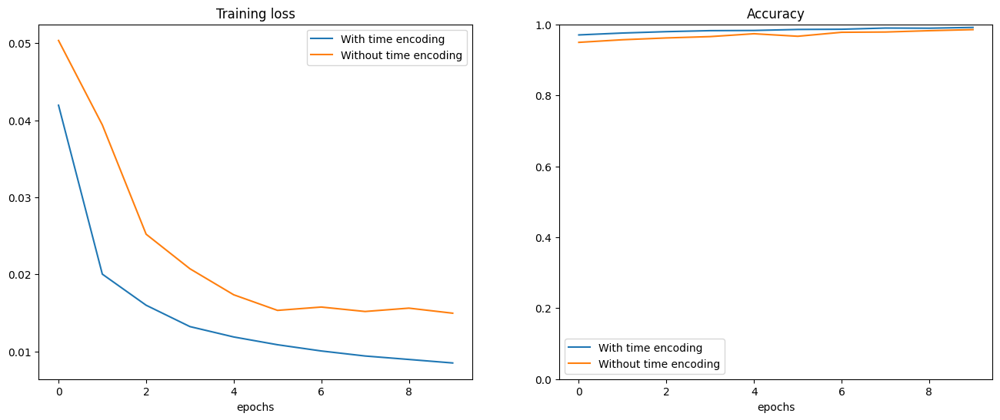

In [86]:
plt.figure(figsize=(8*2,6))

plt.subplot(1,2,1)
plt.plot([x[0] for x in loss_list[0]], [x[1] for x in loss_list[0]], label='With time encoding')
plt.plot([x[0] for x in loss_list[1]], [x[1] for x in loss_list[1]], label='Without time encoding')
plt.title('Training loss')
plt.legend()
plt.xlabel('epochs')

plt.subplot(1,2,2)
plt.plot([x[0] for x in accuracy_list[0]], [x[1] for x in accuracy_list[0]], label='With time encoding')
plt.plot([x[0] for x in accuracy_list[1]], [x[1] for x in accuracy_list[1]], label='Without time encoding')
plt.title('Accuracy')
plt.ylim(0.,1.)
plt.xlabel('epochs')
plt.legend()

print('Accuracy with time encoding : {:.3f} without: {:.3f}'.format(accuracy_list[0][-1][1],accuracy_list[1][-1][1]))

**Question 5e**
<a name='question5e'></a>

Implement batching to prevent memory issues when evaluating large number of pixels with the MLP. Batch size should not exceed 16000.

Write a partition indexing function to create a list of partition indices that can be used to split the input into equal size chunks for prediction

In [67]:
def partition_index(totalsize, chunksize):
    '''
    Args:
        - totalsize: int, Size of the batch to process
        - chunksize: int, subdivision to apply
    Return:
        - list_tuples: List, List of tuples (i,j) to process the batch in equal chunk
    '''
    #begin_solution

    list_tuples = []

    i = 0
    while i < totalsize:
        j = i + chunksize
        if j > totalsize:
            j = totalsize

        list_tuples.append((i, j))
        i = j

    #end_solution

    return list_tuples

Update image prediction to use the implemented batch partitioning

In [68]:
def predict_images(images, model, device='cuda', scale=True):
  '''
  Reconstruct the complete set of images from the overfitted MLP model

  Args:
    - images TORCH_INT32 (N_frames, H, W)
    - model, takes as input a batch of pixel positions (K,2) and return pixel value (K,1)
  Return:
    - prediction TORCHFLOAT32 (N_frames, H, W) [CPU]
  '''
  #begin_solution

  N_frames, H, W = images.shape
  prediction_list = []
  batch_size = 10000
  partition_indices = partition_index(N_frames * H * W, batch_size)

  # Iterate over all the positions that need to be predicted in batches and
  # create a list of positions (x, y, t) across frames, H, and W for each batch
  for start, end in partition_indices:
    positions = []
    for idx in range(start, end):
      t = idx // (H * W) / N_frames if scale else idx // (H * W)
      i = (idx // W) % H
      j = idx % W

      x = i / H if scale else i
      y = j / W if scale else j
      positions.append([y, x, t])

    positions = torch.FloatTensor(positions).to(device)
    with torch.no_grad():
      model.eval()
      prediction = model(positions)

    # Important to use (end-start) when reshaping as last batch isn't of size batch_size
    # if N_frames * H * W is not divisible by batch_size
    prediction = prediction.reshape((end - start, 1))
    prediction_list.append(prediction)

  prediction = torch.cat(prediction_list, dim=0)
  prediction = prediction.reshape((N_frames, H, W)).cpu()

  #end_solution


  return prediction


**Question 5f**
<a name='question5f'></a>

Write code to generate a video of 100 frames uniformly sampled between the first and last frame. Save the video as an MP4.

In [71]:
output_path = 'result_bw_video.mp4'
#begin_solution

# Load implicit_images_sequence.pth as overall this model performed the best. While the
# implicit_images_sequence_with_time_encoding.pth and implicit_images_sequence_without_time_encoding.pth
# models reached similar accuracy to implicit_images_sequence.pth, training time was significantly
# longer due to the extra matrix multiplication required to calculate positional encodings.
# These models also take a lot longer to predict, making video generation slow.
# implicit_images_sequence.pth can predict 100 frames in 2 seconds (using batch partitioning).
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
state_dict = torch.load("models/implicit_images_sequence_without_time_encoding.pth")
model = state_dict["model"].to(device)

# Create any 'image' of shape (128, 128), for example an image of all zeros, and stack it 100 times
# to serve as the input to the model. Model will output 100 prediction frames, each of shape (128, 128).
N_frames = 100
H, W = X_resized[0].shape
image = torch.zeros((H, W), dtype=torch.float32).to(device)
images = [image for _ in range(N_frames)]
images = torch.stack(images).to(device)

with torch.no_grad():
    model.eval()
    prediction = predict_images(images, model, device)

# Convert pixel value predictions to 0 or 1 for perfect black and white frames
# and convert to numpy array for imageio to write to video (uint8 type is needed
# to get rid of warning message).
prediction[prediction < 0.5] = 0
prediction[prediction >= 0.5] = 1
prediction = prediction.numpy()
prediction = prediction.astype(np.uint8)

with imageio.get_writer(output_path, mode='I', fps=10) as writer:
    for k in range(prediction.shape[0]):
        writer.append_data(255*prediction[k])

#end_solution

Video(output_path)